<a href="https://colab.research.google.com/github/EmanuelAlogna/MRI-generation/blob/master/results/pix2pix_(P2P_t1)_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import libraries and mount the drive

In [1]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import os
from IPython import display
import time
import math

print(tf.__version__)

from google.colab import drive
drive.mount('/content/drive')

TensorFlow 2.x selected.
2.1.0-rc1
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Loading train, validation and test sets

In [0]:
def get_feature_description(modalities):                                                   
                                                                                           
    feature_description =lambda mod : {                                                    
                            mod+'_mri': tf.io.FixedLenFeature([], tf.string),              
                            mod+'_path': tf.io.FixedLenFeature([], tf.string),             
                                                                                           
                            mod+'_mri_min': tf.io.FixedLenFeature([], tf.float32),         
                            mod+'_mri_min_src': tf.io.FixedLenFeature([], tf.float32),     
                            mod+'_mri_max': tf.io.FixedLenFeature([], tf.float32),         
                            mod+'_mri_max_src': tf.io.FixedLenFeature([], tf.float32),     
                                                                                           
                            mod+'_mri_lperc': tf.io.FixedLenFeature([], tf.float32),       
                            mod+'_mri_hperc': tf.io.FixedLenFeature([], tf.float32),       
                            mod+'_mri_hperc_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_mri_lperc_src': tf.io.FixedLenFeature([], tf.float32),   
                                                                                           
                            mod+'_x_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_y_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_z_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_z_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                            mod+'_x_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                            mod+'_y_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                                                                                           
                            mod+'_x_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                            mod+'_y_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                            mod+'_z_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                                                                                           
                            mod+'_z_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_x_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_y_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                                                                                           
                            mod+'_patient': tf.io.FixedLenFeature([], tf.string),          
                            mod+'_sample_number': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_patient_grade': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_location': tf.io.FixedLenFeature([], tf.string),         
                            mod+'_dataset_version': tf.io.FixedLenFeature([], tf.string),  
                            mod+'_dataset_name': tf.io.FixedLenFeature([], tf.string),     
                            mod+'_mri_type': tf.io.FixedLenFeature([], tf.string),         
                            mod+'_dataset_split': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_patient_mri_seq': tf.io.FixedLenFeature([], tf.string),  
                          }                                                                
    features = {}                                                                          
    for mod in modalities:
        features.update(feature_description(mod))
    return features

In [0]:
#BUFFER_SIZE = 400
BATCH_SIZE = 32

In [0]:
use_gzip_compression = True

def load_dataset(name, mri_type, center_crop=None, random_crop=None, filter=None, batch_size=BATCH_SIZE, cache=True, 
                 prefetch_buffer=1, shuffle_buffer=128, interleave=1, cast_to=tf.float32, clip_labels_to=0.0, 
                 take_only=None, shuffle=True, infinite=False, n_threads=os.cpu_count()):
    def parse_sample(sample_proto):
        parsed = tf.io.parse_single_example(sample_proto, get_feature_description(["OT"]+mri_type))
        # Decoding image arrays
        
        slice_shape = [parsed['OT_x_dimension'.format(mri_type[0])], parsed['OT_y_dimension'], 1]
        # Decoding the ground truth
        parsed['seg'] = tf.cast(tf.reshape(tf.io.decode_raw(parsed['OT_mri'], tf.float32), shape=slice_shape), dtype=cast_to)
        # Decode each channel and stack in a 3d volume
        stacked_mri = list()
        for mod in mri_type:
            stacked_mri.append(tf.cast(tf.reshape(tf.io.decode_raw(parsed['{}_mri'.format(mod)], tf.float32), shape=slice_shape), dtype=cast_to))
        parsed['mri'] = tf.concat(stacked_mri, axis=-1)
        # Clipping the labels if requested
        parsed['seg'] = tf.clip_by_value(parsed['seg'], 0.0, clip_labels_to) if clip_labels_to else parsed['seg']
        
        # Cropping
        if random_crop or center_crop:
            # Stacking the mri and the label to align the crop shape
            mri_seg = tf.concat([parsed['mri'], parsed['seg']], axis=-1)
            if random_crop:
                random_crop[-1] = mri_seg.shape[-1] 
                cropped = tf.image.random_crop(mri_seg, size=random_crop)
            else:
                cropped = tf.image.resize_with_crop_or_pad(mri_seg,center_crop[0],center_crop[1])
            # Splitting back
            parsed['mri'] = cropped[:,:,:len(mri_type)]
            parsed['seg'] = cropped[:,:,len(mri_type):]
        
        return parsed
    
    path = './drive/My Drive/MRI-generation/{}.tfrecords'.format(name)
    dataset = tf.data.TFRecordDataset(path, compression_type='GZIP' if use_gzip_compression else "")
    dataset = dataset.filter(filter) if filter is not None else dataset
    dataset = dataset.take(take_only) if take_only is not None else dataset

    # You should generally cache after loading and preprocessing the data, 
    # but before shuffling, repeating, batching and prefetching”
    dataset = dataset.cache() if cache else dataset
    if shuffle and infinite:
        dataset = dataset.apply(tf.data.experimental.shuffle_and_repeat(shuffle_buffer))
    else:
        dataset = dataset.shuffle(shuffle_buffer, reshuffle_each_iteration=True) if shuffle else dataset
        dataset = dataset.repeat() if infinite else dataset
    dataset = dataset.map(parse_sample, num_parallel_calls=None)
    dataset = dataset.batch(batch_size) if batch_size > 0 else dataset
    

    if interleave > 1:
        dataset = dataset.interleave(lambda x: tf.data.Dataset.from_tensors(x).repeat(interleave), cycle_length=n_threads, block_length=interleave, num_parallel_calls=n_threads)
  
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

In [0]:
# loading all the dataset, with only modality T1 and T2
# I'll focus now on synthesizing T2 from T1

def load_datasets():
    validation = load_dataset('brats2015_validation_crop_mri', ['MR_T1', 'MR_T2'], shuffle=False)
    training = load_dataset('brats2015_training_crop_mri', ['MR_T1', 'MR_T2'], shuffle=True)
    testing = load_dataset('brats2015_testing_crop_mri', ['MR_T1', 'MR_T2'], shuffle=True)
    return training, validation , testing

In [0]:
training, validation, testing = load_datasets() # I'll use this in case I get stuck with the cache.

modalities = ['MR_T2_mri', 'MR_T1_mri', 'OT_mri']

## Load some useful functions


In [0]:
# PROCESSING IMAGES IN THE BATCH
def process_batch(batch):   # takes in input a raw_record[mod].numpy()
    batch = tf.io.decode_raw(batch, tf.float32)
    batch = tf.reshape(batch, (BATCH_SIZE, 180, 180))
    paddings = tf.constant([[0, 0], [38, 38], [38, 38]])
    batch = tf.pad(batch, paddings, "CONSTANT")
    batch = tf.expand_dims(batch, axis=3)
    return batch
    
# final shape will be (bs, 256, 256, 1): now the batch is ready to be fed to the GAN

In [0]:
# this function preprocesses the input image and the ground truth from a raw_record
# images in the return are then ready to be fed into the GAN
def take_images_from_raw(raw_record, ot=False):

    inp, ground_truth = raw_record[modalities[0]], raw_record[modalities[1]]
    inp = process_batch(inp)
    ground_truth = process_batch(ground_truth)
    if ot:      # if ot is true, I'll retrieve also the segmentation from the raw_record
        segmentation = process_batch(raw_record[modalities[2]])
        return inp, ground_truth, segmentation
    return inp, ground_truth

In [0]:
def resize_with_crop(*args): # possibile arguments: input, gt, prediction and maybe the segmentation

    image0 = tf.image.resize_with_crop_or_pad(args[0], 155, 194)
    image1 = tf.image.resize_with_crop_or_pad(args[1], 155, 194)
    image2 = tf.image.resize_with_crop_or_pad(args[2], 155, 194)
    if len(args) == 4:      # crop also the segmentation, if is given as additional argument
        image3 = tf.image.resize_with_crop_or_pad(args[3], 155, 194)
        return image0, image1, image2, image3
    return image0, image1, image2

In [0]:
def retrieve_tumor_area(ground_truth, prediction, segmentation):
    ground_truth_np = ground_truth.numpy()
    segmentation_np = segmentation.numpy()
    prediction_np = prediction.numpy()

    # I want to remove all the pixels not relevant wrt the tumor area. 
    idx = (segmentation_np==0)      
    ground_truth_np[idx] = segmentation_np[idx]
    prediction_np[idx] = segmentation_np[idx]

    return ground_truth_np, prediction_np      # Now the images are ready to be evaluated

In [0]:
def evaluate_GAN(model, dataset, set_type, evaluate_tumor_area=False, print_loss=False, epc=99):
    num_batches = 0                 # CAREFUL when batch_size is modified!!!
    if set_type == 'test':
        num_batches = 112           # in the test set, with batch 32, there are 112 elements.
    elif set_type == 'validation':
        num_batches = 108
    elif set_type == 'train':
        num_batches = 876
    container_psnr = tf.TensorArray(tf.float32, size=num_batches)     
    container_mse = tf.TensorArray(tf.float32, size=num_batches)
    container_ssim = tf.TensorArray(tf.float32, size=num_batches)
    
    if evaluate_tumor_area:
        container_psnr_tumor = tf.TensorArray(tf.float32, size=num_batches)     
        container_mse_tumor = tf.TensorArray(tf.float32, size=num_batches)
        container_ssim_tumor = tf.TensorArray(tf.float32, size=num_batches)
    if print_loss:
        container_gen = tf.TensorArray(tf.float32, size=num_batches)     
        container_disc = tf.TensorArray(tf.float32, size=num_batches)
    
    #idx = 0
    #for raw_record in dataset.take(10):
    for idx, raw_record in dataset.enumerate():
        inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)
        # generate the prediction        
        prediction = model(inp, training=False)
        # crop the images
        inp_cr, ground_truth_cr, prediction_cr, segmentation_cr = resize_with_crop(inp, ground_truth, prediction, segmentation)
        if evaluate_tumor_area:
            ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth_cr, prediction_cr, segmentation_cr)
        if (idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83) and evaluate_tumor_area:
            plot_images_new(inp_cr, ground_truth_cr, prediction_cr, ground_truth_masked, prediction_masked)
        elif idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:
            plot_images_new(inp_cr, ground_truth_cr, prediction_cr)
        
        # normalize the prediction and the ground_truth
        prediction_normalized_cr = mean_normalize(prediction_cr)
        ground_truth_normalized_cr = mean_normalize(ground_truth_cr)

        # compute the metrics of similarity
        mean, std, psnr = compute_psnr(ground_truth_normalized_cr, prediction_normalized_cr)
        container_psnr = container_psnr.write(idx, psnr)
        mean, std, mse = compute_mse(ground_truth_normalized_cr, prediction_normalized_cr)
        container_mse = container_mse.write(idx, mse)
        mean, std, ssim = compute_ssim(ground_truth_normalized_cr, prediction_normalized_cr)
        container_ssim = container_ssim.write(idx, ssim)

        if evaluate_tumor_area:
            # discard black images from pred and gt
            prediction_masked_normalized = mean_normalize(prediction_masked)
            ground_truth_masked_normalized = mean_normalize(ground_truth_masked) 
            #if (epc % 8 == 1) and idx == 0:
            #    plot_images(ground_truth_masked, prediction_masked)
            mean, std, psnr = compute_psnr(ground_truth_masked_normalized, prediction_masked_normalized)
            container_psnr_tumor = container_psnr_tumor.write(idx, psnr)
            mean, std, mse = compute_mse(ground_truth_masked_normalized, prediction_masked_normalized)
            container_mse_tumor = container_mse_tumor.write(idx, mse)
            mean, std, ssim = compute_ssim(ground_truth_masked_normalized, prediction_masked_normalized)
            container_ssim_tumor = container_ssim_tumor.write(idx, ssim)

        # COMPUTES VALIDATION LOSSES FOR THE GENERATOR AND THE DISCRIMINATOR
        if print_loss:
            disc_real_output = discriminator([inp, ground_truth], training=False)
            disc_generated_output = discriminator([inp, prediction], training=False)
            gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, ground_truth)
            disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
            container_gen = container_gen.write(idx, gen_total_loss)
            container_disc = container_disc.write(idx, disc_loss)
        #idx += 1

    container_psnr = container_psnr.stack()
    container_mse = container_mse.stack()
    container_ssim = container_ssim.stack()
    mean_psnr = tf.reduce_mean(tf.boolean_mask((container_psnr), tf.math.is_finite(container_psnr)))
    std_psnr = tf.math.reduce_std(tf.boolean_mask((container_psnr), tf.math.is_finite(container_psnr)))
    mean_mse = tf.reduce_mean(tf.boolean_mask((container_mse), tf.math.is_finite(container_mse)))
    std_mse = tf.math.reduce_std(tf.boolean_mask((container_mse), tf.math.is_finite(container_mse)))
    mean_ssim = tf.reduce_mean(tf.boolean_mask((container_ssim), tf.math.is_finite(container_ssim)))
    std_ssim = tf.math.reduce_std(tf.boolean_mask((container_ssim), tf.math.is_finite(container_ssim)))

    print("PSNR on {} set: {} ± {}".format(set_type, (f'{mean_psnr:.4f}'), (f'{std_psnr:.4f}')))
    print("MSE on {} set: {} ± {}".format(set_type, (f'{mean_mse:.4f}'), (f'{std_mse:.4f}')))
    print("SSIM on {} set: {} ± {}".format(set_type, (f'{mean_ssim:.4f}'), (f'{std_ssim:.4f}')))

    if evaluate_tumor_area:
        container_psnr_tumor = container_psnr_tumor.stack()
        container_mse_tumor = container_mse_tumor.stack()
        container_ssim_tumor = container_ssim_tumor.stack()
        mean_psnr_tumor = tf.reduce_mean(tf.boolean_mask((container_psnr_tumor), tf.math.is_finite(container_psnr_tumor)))
        std_psnr_tumor = tf.math.reduce_std(tf.boolean_mask((container_psnr_tumor), tf.math.is_finite(container_psnr_tumor)))
        mean_mse_tumor = tf.reduce_mean(tf.boolean_mask((container_mse_tumor), tf.math.is_finite(container_mse_tumor)))
        std_mse_tumor = tf.math.reduce_std(tf.boolean_mask((container_mse_tumor), tf.math.is_finite(container_mse_tumor)))
        mean_ssim_tumor = tf.reduce_mean(tf.boolean_mask((container_ssim_tumor), tf.math.is_finite(container_ssim_tumor)))
        std_ssim_tumor = tf.math.reduce_std(tf.boolean_mask((container_ssim_tumor), tf.math.is_finite(container_ssim_tumor)))
        print()
        print("PSNR wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_psnr_tumor:.4f}'), (f'{std_psnr_tumor:.4f}')))
        print("MSE wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_mse_tumor:.4f}'), (f'{std_mse_tumor:.4f}')))
        print("SSIM wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_ssim_tumor:.4f}'), (f'{std_ssim_tumor:.4f}')))
    if print_loss:
        container_disc = container_disc.stack()
        container_gen = container_gen.stack()
        mean_gen = tf.reduce_mean(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
        std_gen = tf.math.reduce_std(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
        mean_disc = tf.reduce_mean(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
        std_disc = tf.math.reduce_std(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
        print()
        print("Generator loss on {} set: {} ± {}".format(set_type, (f'{mean_gen:.4f}'), (f'{std_gen:.4f}')))
        print("Discriminator loss on {} set: {} ± {}".format(set_type, (f'{mean_disc:.4f}'), (f'{std_disc:.4f}')))
        
    if tf.equal(print_loss, True) and tf.equal(evaluate_tumor_area, False):
        return mean_psnr, mean_mse, mean_ssim, mean_gen, mean_disc
    elif tf.equal(print_loss, False) and tf.equal(evaluate_tumor_area, True):
        return mean_psnr, mean_mse, mean_ssim, mean_psnr_tumor, mean_mse_tumor, mean_ssim_tumor
    elif tf.equal(print_loss, True) and tf.equal(evaluate_tumor_area, True):
        return mean_psnr, mean_mse, mean_ssim, mean_psnr_tumor, mean_mse_tumor, mean_ssim_tumor, mean_gen, mean_disc
    return mean_psnr, mean_mse, mean_ssim

In [12]:
"""s = 3
container_gen = tf.TensorArray(tf.float32, size=s)
container_disc = tf.TensorArray(tf.float32, size=s)
idx = 0

generator = Generator()
discriminator = Discriminator()

for raw_record in testing.take(s):
    input_image, target = take_images_from_raw(raw_record)

    prediction = generator(input_image, training=False)

    # showing to D a batch of real images of T2
    disc_real_output = discriminator([input_image, target], training=True)
    # showing to D a batch fake images of T2
    disc_generated_output = discriminator([input_image, prediction], training=True)
    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    container_gen = container_gen.write(idx, gen_total_loss)
    container_disc = container_disc.write(idx, disc_loss)

    idx += 1
container_gen = container_gen.stack()
container_disc = container_disc.stack()

mean_gen = tf.reduce_mean(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
std_gen = tf.math.reduce_std(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
print("GEN loss: {} ± {}".format((f'{mean_gen:.4f}'), (f'{std_gen:.4f}')))
mean_disc = tf.reduce_mean(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
std_disc = tf.math.reduce_std(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
print("DISC loss: {} ± {}".format((f'{mean_disc:.4f}'), (f'{std_disc:.4f}')))

plot_loss(mean_gen, mean_disc)
"""

's = 3\ncontainer_gen = tf.TensorArray(tf.float32, size=s)\ncontainer_disc = tf.TensorArray(tf.float32, size=s)\nidx = 0\n\ngenerator = Generator()\ndiscriminator = Discriminator()\n\nfor raw_record in testing.take(s):\n    input_image, target = take_images_from_raw(raw_record)\n\n    prediction = generator(input_image, training=False)\n\n    # showing to D a batch of real images of T2\n    disc_real_output = discriminator([input_image, target], training=True)\n    # showing to D a batch fake images of T2\n    disc_generated_output = discriminator([input_image, prediction], training=True)\n    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, target)\n    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)\n\n    container_gen = container_gen.write(idx, gen_total_loss)\n    container_disc = container_disc.write(idx, disc_loss)\n\n    idx += 1\ncontainer_gen = container_gen.stack()\ncontainer_disc = container_disc.stack()\n

In [0]:
def plot_loss(g_l, d_l):        
    f, (ax1) = plt.subplots(1, 1, figsize=(12, 6))
    f.subplots_adjust(hspace=0.4)
    max_epoch = g_l.shape[0]       # args[0] 
    epoch_list = list(range(1,max_epoch+1))
    ax1.plot(epoch_list, g_l, label='Generator loss')
    ax1.plot(epoch_list, d_l, label='Discriminator Loss')
    ax1.set_xticks(np.arange(1, max_epoch, 5))
    #ax1.set_ylim([0, 10])
    ax1.set_ylabel('Loss Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('LOSS on validation set')
    l1 = ax1.legend(loc="best")

In [0]:
def plot_metrics(*args):        # arguments will be, in order: psnr, mse, ssim, psnr_tumor*, mse_tumor*, ssim_tumor*
    tumor_area = False          # arguments with * are optional
    if len(args) == 6:
        tumor_area = True

    f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 20))
    f.subplots_adjust(hspace=0.4)

    max_epoch = (args[0]).shape[0]       # args[0] 

    epoch_list = list(range(1,max_epoch+1))
    ax1.plot(epoch_list, args[0], label='PSNR')
    if tumor_area: 
        ax1.plot(epoch_list, args[3], label='PSNR on tumor area')
    ax1.set_xticks(np.arange(1, max_epoch, 5))
    ax1.set_ylabel('PSNR Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('PSNR')
    #ax1.set_ylim([12.5, 32.5])
    l1 = ax1.legend(loc="best")

    ax2.plot(epoch_list, args[1], label='MSE')
    if tumor_area: 
        ax2.plot(epoch_list, args[4], label='MSE on tumor area')
    ax2.set_xticks(np.arange(1, max_epoch, 5))
    ax2.set_ylabel('MSE Value')
    ax2.set_xlabel('Epoch')
    ax2.set_title('MSE')
    #ax2.set_ylim([0.0, 0.06])
    l2 = ax2.legend(loc="best")

    ax3.plot(epoch_list, args[2], label='SSIM')
    if tumor_area: 
        ax3.plot(epoch_list, args[5], label='SSIM on tumor area')
    ax3.set_xticks(np.arange(1, max_epoch, 5))
    ax3.set_ylabel('SSIM Value')
    ax3.set_xlabel('Epoch')
    ax3.set_title('SSIM')
    #ax3.set_ylim([0.0,1.0])
    l3 = ax3.legend(loc="best")


In [0]:
# this method was tested to work with 5 and 32 images. Plotting 2, 3 or 4 types per time.

def plot_images(*args, images_to_print=5): 
    if images_to_print == 5: x = 15
    elif images_to_print == 32: x = 90
    if len(args) == 3:
        display_list = [args[0], args[1], args[2]]     # input, gt and prediction
        title = ['Input Image', 'Ground Truth', 'Predicted Image']
        figsize = (x , 9)
    elif len(args) == 2:
        display_list = [args[0], args[1]]     # input and gt
        title = ['GT in tumor area', 'Pred in tumor area']
        figsize = (x , 7)
    elif len(args) == 4:
        display_list = [args[0], args[1], args[2], args[3]]     # gt, prediction, gt_masked, prediction_masked
        title = ['Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']
        figsize = (x , 12)
    elif len(args) == 5:
        display_list = [args[0], args[1], args[2], args[3], args[4]]     # input, gt, prediction, gt_masked, prediction_masked
        title = ['Input', 'Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']
        figsize = (x , 15)
    plt.figure(1 , figsize)
    n = 0
    for i in range(len(args)):
        for j in range(images_to_print):    # batch size is different from 10, but let's show just 10 images.
            n += 1
            plt.subplot(len(args)+1, images_to_print, n).title.set_text(title[i])
            plt.imshow(tf.squeeze(display_list[i][j]), cmap='bone')
            plt.axis('off')
    plt.show()
    print()

In [0]:
# this method was tested to work with 5 and 32 images. Plotting 2, 3 or 4 types per time.

def plot_images_new(*args): 

    if len(args) == 5:
        display_list = [args[0], args[1], args[2], args[3], args[4]]   # input, gt, prediction, gt masked, pred masked
        title = ['Input Image', 'Ground Truth', 'Predicted Image', 'GT Tumor', 'Pred Tumor']
        figsize = (14, 7)
    elif len(args) == 3:
        display_list = [args[0], args[1], args[2]]   # input, gt and prediction
        title = ['Input Image', 'Ground Truth', 'Predicted Image']
        figsize = (8, 4)
    
    plt.figure(1 , figsize)
    n = 0
    for i in range(len(args)):    # batch size is different from 10, but let's show just 10 images.
        n += 1
        plt.subplot(1, len(args), n).title.set_text(title[i])
        plt.imshow(tf.squeeze(display_list[i][0]), cmap='bone')
        plt.axis('off')
    plt.show()

In [17]:
"""idx = 0
#for raw_record in validation.take(40):
for idx, raw_record in enumerate(validation):
    #inp, ground_truth, segmentation = take_images_from_raw(raw_record, True)
    
    inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)
    gen_output = generator(inp, training=False)
    inp, ground_truth, gen_output, segmentation = resize_with_crop(inp, ground_truth, gen_output, segmentation)
    ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth, gen_output, segmentation)
    
    # id = 46.. check it
    if idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:
        plot_images_new(inp, ground_truth, gen_output)
    idx += 1"""

'idx = 0\n#for raw_record in validation.take(40):\nfor idx, raw_record in enumerate(validation):\n    #inp, ground_truth, segmentation = take_images_from_raw(raw_record, True)\n    \n    inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)\n    gen_output = generator(inp, training=False)\n    inp, ground_truth, gen_output, segmentation = resize_with_crop(inp, ground_truth, gen_output, segmentation)\n    ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth, gen_output, segmentation)\n    \n    # id = 46.. check it\n    if idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:\n        plot_images_new(inp, ground_truth, gen_output)\n    idx += 1'

## Min-max normalization

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/73032b45bffd5e5140483fbe1ed49bf174f1962d)

In [0]:
def min_max_rescale(x, xmin, xmax, a, b):
    return (a + (b-a)*(x-xmin)/(xmax-xmin))  
    # to rescale in the range [0, 1], 'a' must be 0 and 'b' = 1

In [0]:
@tf.function
def min_max_normalize(image):
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])
        x = min_max_rescale(image[i], min_value, max_value, 0, 1)
        image_normalized = image_normalized.write(i, x)
    image_normalized = image_normalized.stack()
    return image_normalized

## Mean normalization

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/5c591a0eeba163a12f69f937adbae5886d6273db)

In the paper they say: "Each patient scan is normalized by dividing each sequence by its mean intensity value. "
But the formula is taken from a lecture from Andrew Ng, where he defines the Mean normalization as in the formula above. (resource: https://www.youtube.com/watch?v=e1nTgoDI_m8)

See also: https://stats.stackexchange.com/questions/138046/normalizations-dividing-by-mean

In [0]:
def mean_rescale(x, xmin, xmax):
    mean = tf.reduce_mean(x)
    return ((x-mean)/(xmax-xmin)) 

In [0]:
@tf.function
def mean_normalize(image):
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])
        x = mean_rescale(image[i], min_value, max_value)
        image_normalized = image_normalized.write(i, x)
    image_normalized = image_normalized.stack()
    return image_normalized
    

## Discard black images from batch (put values to 'nan')

This normalization is just to test the metrics and see if there is a big difference in normalizing the prediction and the gt.
This method is used to normalize (and so put to 'nan') only the black images, while the other images of the batch are kept with the original values. This allows me to discard the black images in the computation of the metrics.

In [0]:
def black_images_to_nan(image): 
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])

        # if the max = min most likely it's a black image (or an image without any important information)
        if tf.math.equal(max_value, min_value):        
            x = mean_rescale(image[i], min_value, max_value)
            image_normalized = image_normalized.write(i, x)
        else:
            image_normalized = image_normalized.write(i, image[i])
    image_normalized = image_normalized.stack()
    return image_normalized

##Defining all the quantitative metrics (PSNR, SSIM and MSE)

In [0]:
def compute_psnr(image1, image2):
    # Compute PSNR over tf.float32 Tensors.
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    psnr = tf.image.psnr(im1, im2, max_val=1.0)
    mean = tf.reduce_mean(tf.boolean_mask((psnr), tf.math.is_finite(psnr)))
    std = tf.math.reduce_std(tf.boolean_mask((psnr), tf.math.is_finite(psnr)))
    # In the computation of mean and std, I'm ignoring the 'nan' and 'inf' values
    # Why 'nan' values? 'nan' happens when there is an image with max_value and min_value = 0.0 so a black image
    # the PSNR would be inf (image is totally similar to the ground truth)
    # be rescaling the image, the max_value and min_value would become nan and so the PSNR

    # It ignores also the 'inf' values, in the case I don't want to normalize
    
    return mean, std, psnr

In [0]:
def compute_ssim(image1, image2):
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    ssim = tf.image.ssim(im1, im2, max_val=1)
    mean = tf.reduce_mean(tf.boolean_mask((ssim), tf.math.is_finite(ssim)))
    std = tf.math.reduce_std(tf.boolean_mask((ssim), tf.math.is_finite(ssim)))
    #print(ssim)
    return mean, std, ssim

In [0]:
# I want to compute, first thing, the MSE between ground truth and generated one. The tf.function gives me a Tensor 32x256x256:
# MSE is computed PIXEL per PIXEL, so per each of the 32 matrix 256x256, I average (1) the values of the 256x256 pixels obtaining
# an array of 32 elements, containing the MSEs of each image belonging to the batch. Then I can average (2) these 32 to have 
# I should not average the whole 32x256x256 in one step. The result would have same mean but slightly different std.
# I want first to obtain the MSE of each image... then I average across the batch only to have smth more accurate.

def compute_mse(image1, image2):       # mean squared error
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    mse = tf.metrics.mean_squared_error(im1,im2)
    # In this way is possible to do Variable item-assignment with tensors 
    mse_per_image = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        x = tf.reduce_mean(tf.boolean_mask((mse[i]), tf.math.is_finite(mse[i]))) 
        mse_per_image = mse_per_image.write(i, x)
    mse_per_image = mse_per_image.stack()
    mean = tf.reduce_mean(tf.boolean_mask((mse_per_image), tf.math.is_finite(mse_per_image)))
    std = tf.math.reduce_std(tf.boolean_mask((mse_per_image), tf.math.is_finite(mse_per_image)))
    return mean, std, mse_per_image

## Defining models and optimizers

In [0]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 1

In [0]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [0]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [0]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [0]:
# hint from the web: Unfortunately, UNet does not work with arbitrary input sizes. Try ResNet instead.

def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,1], batch_size=BATCH_SIZE)

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]
  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]
  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same',
                                         kernel_initializer=initializer,activation='tanh') # (bs, 256, 256, 1)
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [0]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)



  return total_gen_loss, gan_loss, l1_loss

In [0]:
generator = Generator()

In [0]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image', batch_size=BATCH_SIZE)
  tar = tf.keras.layers.Input(shape=[256, 256, 1], name='target_image', batch_size=BATCH_SIZE)

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1) #(bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [0]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [0]:
discriminator = Discriminator()

In [0]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Let's load now the generator, discriminator weights and optimizers status from the checkpoints



Uncomment this only to continue to train an already trained network. Otherwise it will be trained a new GAN

In [37]:

print("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))

checkpoint_path = "./drive/My Drive/checkpoints/train3"

ckpt = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                discriminator_optimizer=discriminator_optimizer,
                                generator=generator,
                                discriminator=discriminator)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)


# if a checkpoint exists, restore the latest checkpoint.

if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')



"""
idx = 0     # this is the checkpoint that will be restored.

if len(ckpt_manager.checkpoints) > 0:    # then there is a checkpoint to restore
    ckpt.restore(ckpt_manager.checkpoints[idx])
    print ('Latest checkpoint restored!!')
"""
print("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))
print()


Optimizers and models defined but not initialized? True
Optimizers and models defined but not initialized? True



Now the GAN is restored to the previous checkpoint and ready to be trained again !!!

##**TRAIN THE GAN**

In [0]:
@tf.function
def train_step(input_image, target):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        
        # G produces fake images of T2
        gen_output = generator(input_image, training=True)

        # showing to D a batch of real images of T2
        disc_real_output = discriminator([input_image, target], training=True)
        
        # showing to D a batch fake images of T2
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)


    generator_gradients = gen_tape.gradient(gen_total_loss,
                                            generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                                discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                            generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                                discriminator.trainable_variables))

    #return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss

In [0]:
def fit(train_ds, epochs, val_ds, save_checkpoint, epochs_already_trained, tumor_area, loss):

    psnr_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
    mse_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
    ssim_to_plot = tf.TensorArray(tf.float32, size=epochs+1) 
    if tumor_area:
        psnr_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1)
        mse_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1)
        ssim_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1) 
    if loss:
        g_loss_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
        d_loss_to_plot = tf.TensorArray(tf.float32, size=epochs+1)

    for epoch in range(epochs):
        if epoch == 0:
            ########################### ALL THIS BLOCK IS TO VALIDATE THE RESULTS (and plot them) ##########
            if tf.equal(tumor_area, True) and tf.equal(loss, False):
                psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            elif tf.equal(tumor_area, False) and tf.equal(loss, True):
                psnr, mse, ssim, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            elif tf.equal(tumor_area, True) and tf.equal(loss, True):
                psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            else: 
                psnr, mse, ssim = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss)
            psnr_to_plot = psnr_to_plot.write(epoch, psnr)
            mse_to_plot = mse_to_plot.write(epoch, mse)
            ssim_to_plot = ssim_to_plot.write(epoch, ssim)
            if tumor_area:
                psnr_to_plot_tumor = psnr_to_plot_tumor.write(epoch, psnr_tumor)
                mse_to_plot_tumor = mse_to_plot_tumor.write(epoch, mse_tumor)
                ssim_to_plot_tumor = ssim_to_plot_tumor.write(epoch, ssim_tumor)
            if loss:
                g_loss_to_plot = g_loss_to_plot.write(epoch, g_loss)
                d_loss_to_plot = d_loss_to_plot.write(epoch, d_loss)
            ################################################################################################
            #ckpt_save_path = ckpt_manager.save()
        start = time.time()
        print()
        print("Epoch: ", epoch + 1 + epochs_already_trained)     # I start with epoch 1: the first iteration (not epoch 0)

        # Train
        n = 0
        #for raw_record in train_ds.take(10):
        for idx, raw_record in train_ds.enumerate():
            n += 1
            input_image, target = take_images_from_raw(raw_record)
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
                print(n+1)
            # This is the actual TRAINING STEP
            train_step(input_image, target)
        ########################### ALL THIS BLOCK IS TO VALIDATE THE RESULTS (and plot them) ##########
        if tf.equal(tumor_area, True) and tf.equal(loss, False):
            psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        elif tf.equal(tumor_area, False) and tf.equal(loss, True):
            psnr, mse, ssim, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        elif tf.equal(tumor_area, True) and tf.equal(loss, True):
            psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        else: 
            psnr, mse, ssim = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss)
        psnr_to_plot = psnr_to_plot.write(epoch+1, psnr)
        mse_to_plot = mse_to_plot.write(epoch+1, mse)
        ssim_to_plot = ssim_to_plot.write(epoch+1, ssim)
        if tumor_area:
            psnr_to_plot_tumor = psnr_to_plot_tumor.write(epoch+1, psnr_tumor)
            mse_to_plot_tumor = mse_to_plot_tumor.write(epoch+1, mse_tumor)
            ssim_to_plot_tumor = ssim_to_plot_tumor.write(epoch+1, ssim_tumor)
        if loss:
            g_loss_to_plot = g_loss_to_plot.write(epoch+1, g_loss)
            d_loss_to_plot = d_loss_to_plot.write(epoch+1, d_loss)
            ################################################################################################
        print()

        # saving (checkpoint) the model every 8 epochs
        if (epoch + 1) % 8 == 0 and save_checkpoint:
            ckpt_save_path = ckpt_manager.save()
            print ('Saving checkpoint for epoch {} at {}'.format(epoch+ 1 + epochs_already_trained,
                                                         ckpt_save_path))

        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1 + epochs_already_trained,
                                                            time.time()-start))
    if save_checkpoint:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving {} checkpoint for epoch {} at {}'.format("FINAL", epoch+ 1 + epochs_already_trained,
                                                         ckpt_save_path))

    psnr_to_plot = psnr_to_plot.stack()
    mse_to_plot = mse_to_plot.stack()
    ssim_to_plot = ssim_to_plot.stack()
    if tumor_area:
        psnr_to_plot_tumor = psnr_to_plot_tumor.stack()
        mse_to_plot_tumor = mse_to_plot_tumor.stack()
        ssim_to_plot_tumor = ssim_to_plot_tumor.stack()
    if loss:
        g_loss_to_plot = g_loss_to_plot.stack()
        d_loss_to_plot = d_loss_to_plot.stack()
        
    if tf.equal(loss, True) and tf.equal(tumor_area, False):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, g_loss_to_plot, d_loss_to_plot
    elif tf.equal(loss, False) and tf.equal(tumor_area, True):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, psnr_to_plot_tumor, mse_to_plot_tumor, ssim_to_plot_tumor
    elif tf.equal(loss, True) and tf.equal(tumor_area, True):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, psnr_to_plot_tumor, mse_to_plot_tumor, ssim_to_plot_tumor, g_loss_to_plot, d_loss_to_plot
    return psnr_to_plot, mse_to_plot, ssim_to_plot

In [0]:
!pip install -q pyyaml h5py  # Required to save models in HDF5 format

## Fit of the model (at the end it will also save the models)

I save the models (I would need to save only the generator to be precise) in the same cell of the fitting because Google Colab, with long-run execution, doesn't allow to execute other cells after the one where I call 'fit'

Suggestion: train for around 35 epochs. Long-run are discouraged since Google Colab will crash.
Last time it arrived until the 43th epoch (409 seconds each).
So MAX TRAINING TIME ALLOWED: almost 5 hours. -> after that GPU won't be available for 8 hours or so

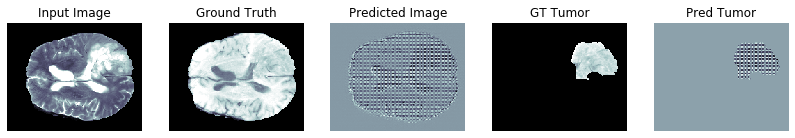

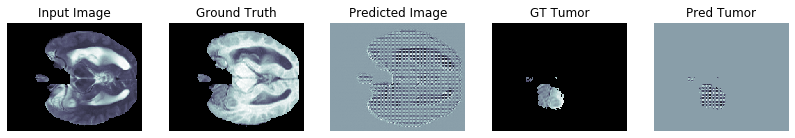

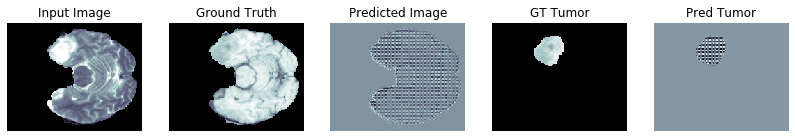

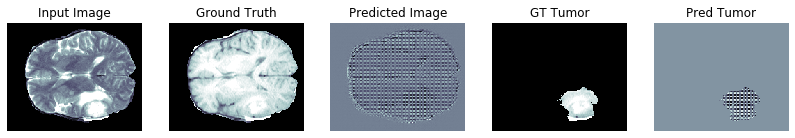

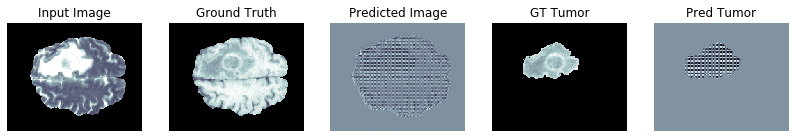

PSNR on validation set: 8.9124 ± 3.2095
MSE on validation set: 0.1493 ± 0.0570
SSIM on validation set: -0.0296 ± 0.1107

PSNR wrt tumor area on validation set: 16.7516 ± 6.3867
MSE wrt tumor area on validation set: 0.0380 ± 0.0300
SSIM wrt tumor area on validation set: 0.1398 ± 0.3771

Generator loss on validation set: 13.3941 ± 5.8269
Discriminator loss on validation set: 1.3860 ± 0.0003

Epoch:  1
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.........................................................................

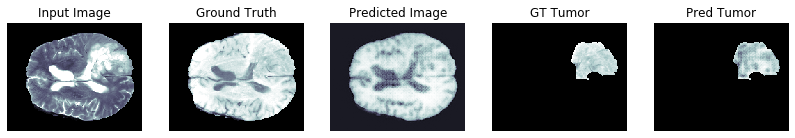

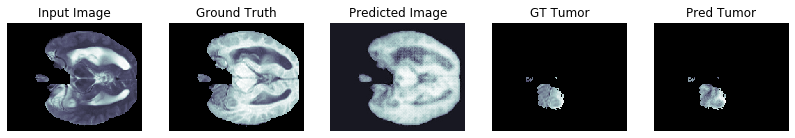

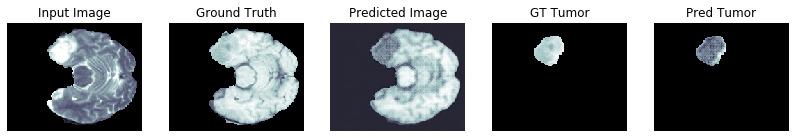

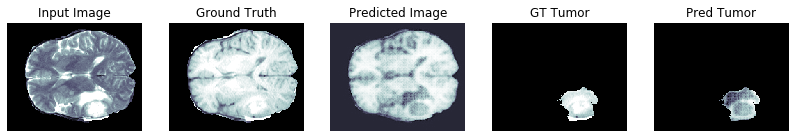

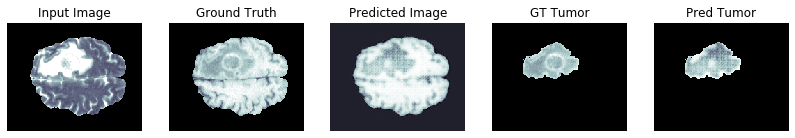

PSNR on validation set: 20.1496 ± 3.3143
MSE on validation set: 0.0117 ± 0.0060
SSIM on validation set: 0.7523 ± 0.1077

PSNR wrt tumor area on validation set: 31.8163 ± 10.1466
MSE wrt tumor area on validation set: 0.0018 ± 0.0020
SSIM wrt tumor area on validation set: 0.9595 ± 0.0351

Generator loss on validation set: 2.5722 ± 0.8012
Discriminator loss on validation set: 1.8010 ± 0.2154

Time taken for epoch 1 is 420.3333637714386 sec


Epoch:  2
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.......................

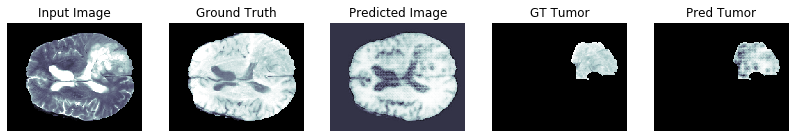

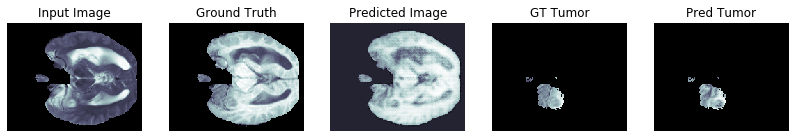

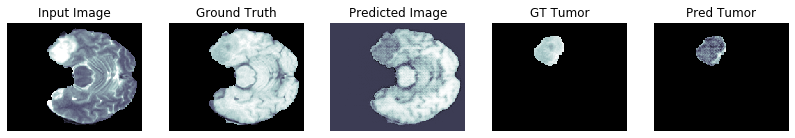

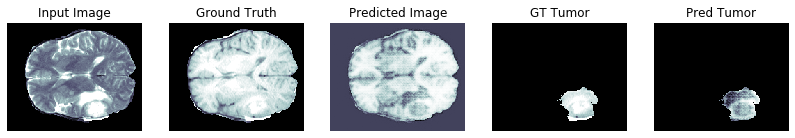

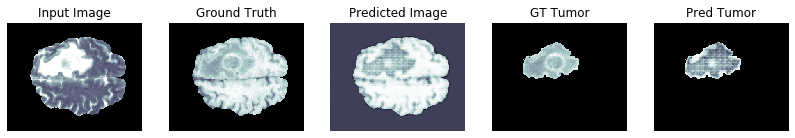

PSNR on validation set: 18.3522 ± 3.7821
MSE on validation set: 0.0184 ± 0.0097
SSIM on validation set: 0.7260 ± 0.1119

PSNR wrt tumor area on validation set: 30.3649 ± 11.6545
MSE wrt tumor area on validation set: 0.0028 ± 0.0033
SSIM wrt tumor area on validation set: 0.9483 ± 0.0470

Generator loss on validation set: 2.6649 ± 0.9932
Discriminator loss on validation set: 1.6826 ± 0.0511

Time taken for epoch 2 is 413.9155967235565 sec


Epoch:  3
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.......................

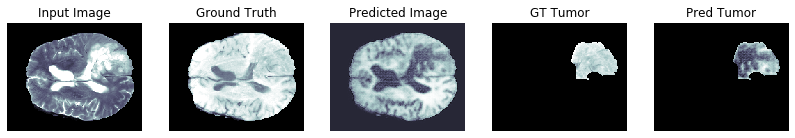

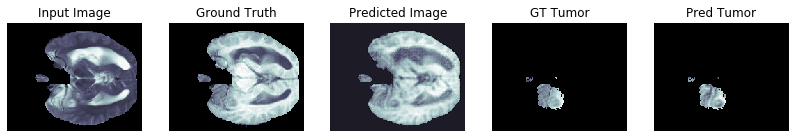

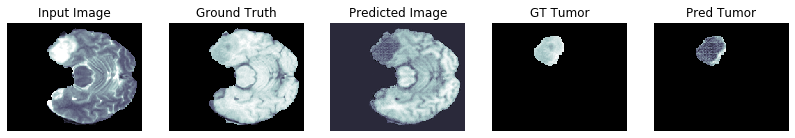

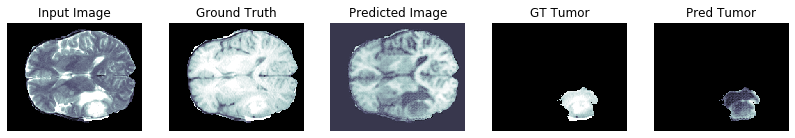

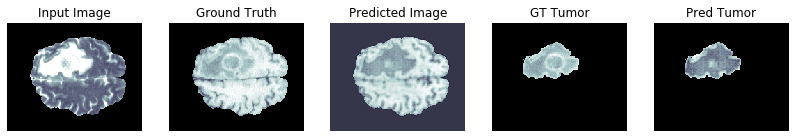

PSNR on validation set: 17.6235 ± 4.1509
MSE on validation set: 0.0230 ± 0.0133
SSIM on validation set: 0.7154 ± 0.1203

PSNR wrt tumor area on validation set: 28.6937 ± 10.3092
MSE wrt tumor area on validation set: 0.0041 ± 0.0047
SSIM wrt tumor area on validation set: 0.9256 ± 0.0644

Generator loss on validation set: 3.9645 ± 1.6951
Discriminator loss on validation set: 1.4544 ± 0.0169

Time taken for epoch 3 is 414.02075481414795 sec


Epoch:  4
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

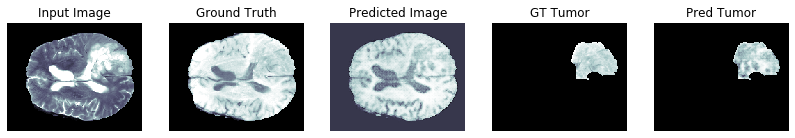

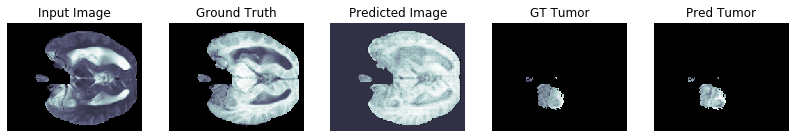

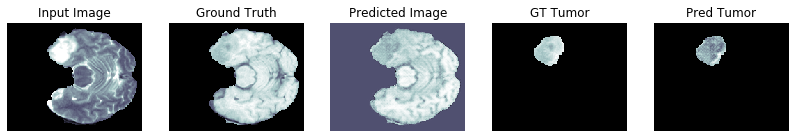

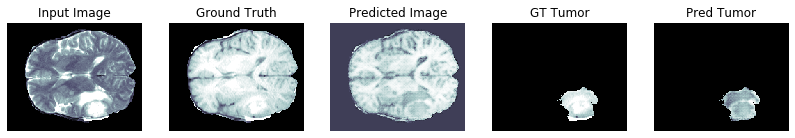

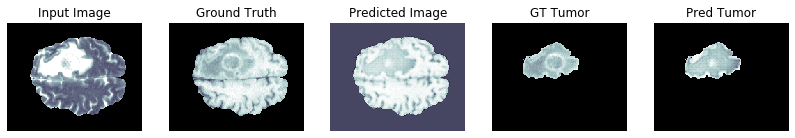

PSNR on validation set: 18.9348 ± 3.8481
MSE on validation set: 0.0163 ± 0.0087
SSIM on validation set: 0.7570 ± 0.1021

PSNR wrt tumor area on validation set: 32.7716 ± 9.7051
MSE wrt tumor area on validation set: 0.0014 ± 0.0015
SSIM wrt tumor area on validation set: 0.9656 ± 0.0318

Generator loss on validation set: 2.5637 ± 0.9853
Discriminator loss on validation set: 2.1208 ± 0.0672

Time taken for epoch 4 is 414.46087169647217 sec


Epoch:  5
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.......................

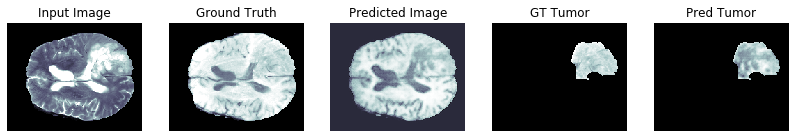

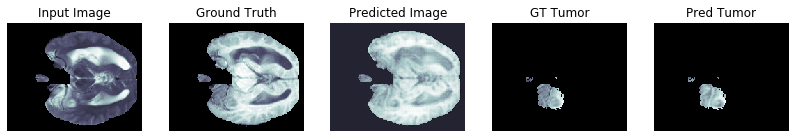

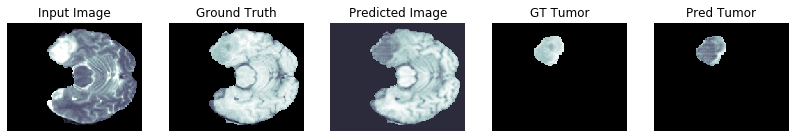

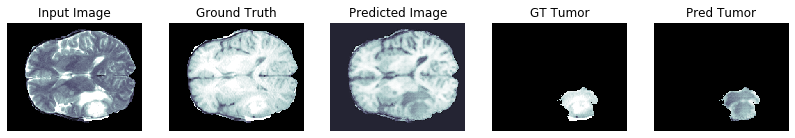

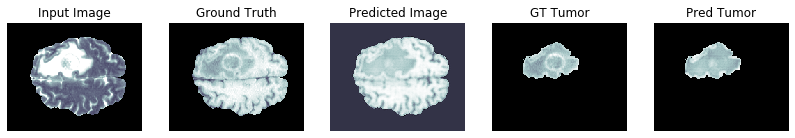

PSNR on validation set: 20.4790 ± 3.7856
MSE on validation set: 0.0115 ± 0.0066
SSIM on validation set: 0.7915 ± 0.0971

PSNR wrt tumor area on validation set: 32.9937 ± 11.4158
MSE wrt tumor area on validation set: 0.0015 ± 0.0017
SSIM wrt tumor area on validation set: 0.9655 ± 0.0328

Generator loss on validation set: 2.6147 ± 0.8021
Discriminator loss on validation set: 1.4196 ± 0.0158

Time taken for epoch 5 is 414.937864780426 sec


Epoch:  6
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
........................

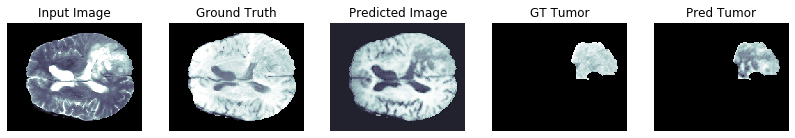

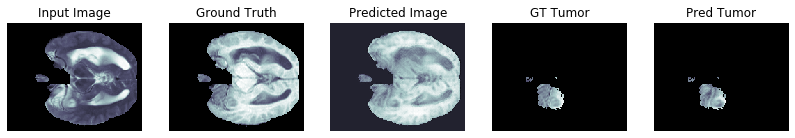

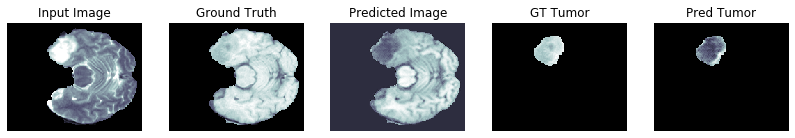

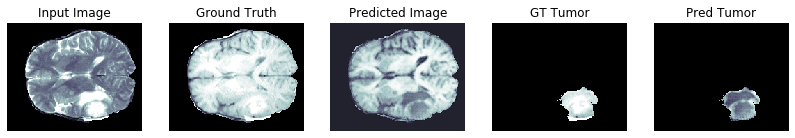

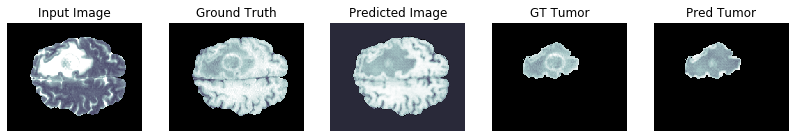

PSNR on validation set: 19.9805 ± 3.9171
MSE on validation set: 0.0131 ± 0.0076
SSIM on validation set: 0.7778 ± 0.1043

PSNR wrt tumor area on validation set: 30.9143 ± 9.6936
MSE wrt tumor area on validation set: 0.0023 ± 0.0026
SSIM wrt tumor area on validation set: 0.9534 ± 0.0419

Generator loss on validation set: 2.5329 ± 1.0458
Discriminator loss on validation set: 2.0987 ± 0.1279

Time taken for epoch 6 is 414.08499550819397 sec


Epoch:  7
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.......................

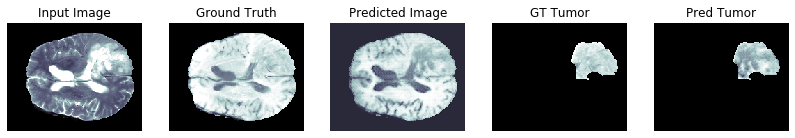

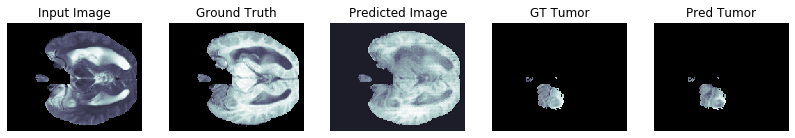

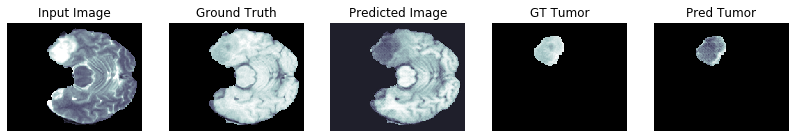

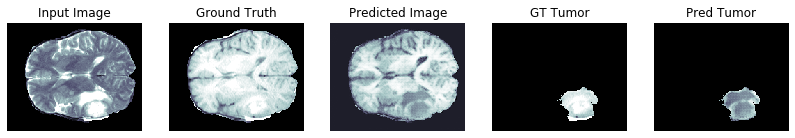

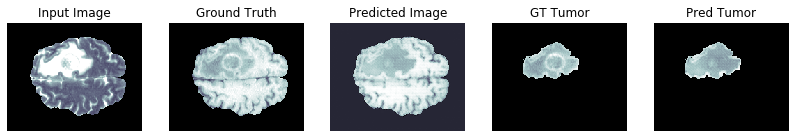

PSNR on validation set: 20.4728 ± 3.7619
MSE on validation set: 0.0115 ± 0.0065
SSIM on validation set: 0.7830 ± 0.1029

PSNR wrt tumor area on validation set: 32.2034 ± 11.2007
MSE wrt tumor area on validation set: 0.0018 ± 0.0021
SSIM wrt tumor area on validation set: 0.9612 ± 0.0354

Generator loss on validation set: 2.8021 ± 0.9298
Discriminator loss on validation set: 1.4641 ± 0.0330

Time taken for epoch 7 is 414.12391328811646 sec


Epoch:  8
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

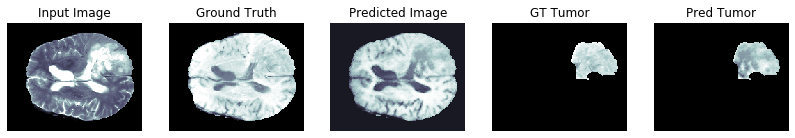

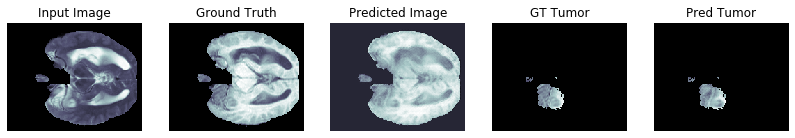

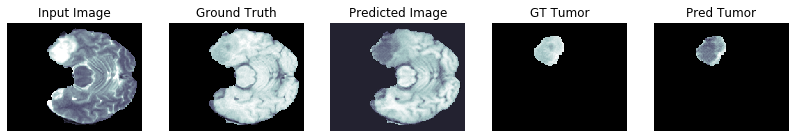

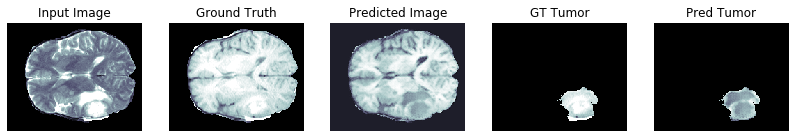

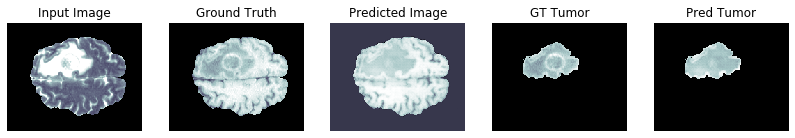

PSNR on validation set: 21.0831 ± 3.7846
MSE on validation set: 0.0100 ± 0.0058
SSIM on validation set: 0.8000 ± 0.0976

PSNR wrt tumor area on validation set: 33.0225 ± 9.4313
MSE wrt tumor area on validation set: 0.0014 ± 0.0016
SSIM wrt tumor area on validation set: 0.9670 ± 0.0308

Generator loss on validation set: 2.7830 ± 0.8662
Discriminator loss on validation set: 1.4433 ± 0.0374

Saving checkpoint for epoch 8 at ./drive/My Drive/checkpoints/train3/ckpt-1
Time taken for epoch 8 is 417.8924927711487 sec


Epoch:  9
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
.....................................................

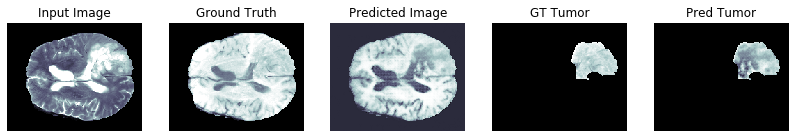

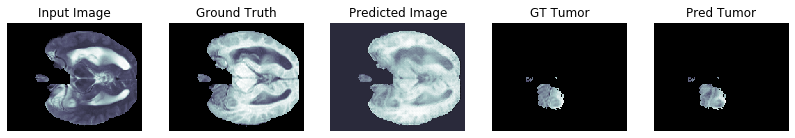

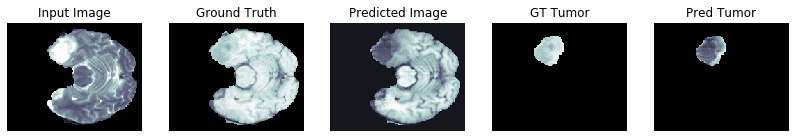

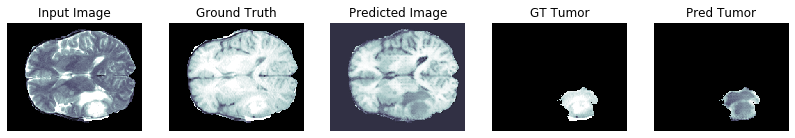

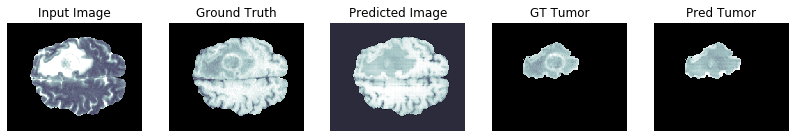

PSNR on validation set: 20.4052 ± 3.8308
MSE on validation set: 0.0118 ± 0.0068
SSIM on validation set: 0.7828 ± 0.1022

PSNR wrt tumor area on validation set: 31.8665 ± 10.2318
MSE wrt tumor area on validation set: 0.0019 ± 0.0024
SSIM wrt tumor area on validation set: 0.9592 ± 0.0381

Generator loss on validation set: 2.2747 ± 0.8746
Discriminator loss on validation set: 1.6978 ± 0.0269

Time taken for epoch 9 is 414.90156054496765 sec


Epoch:  10
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

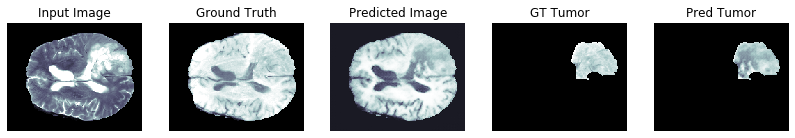

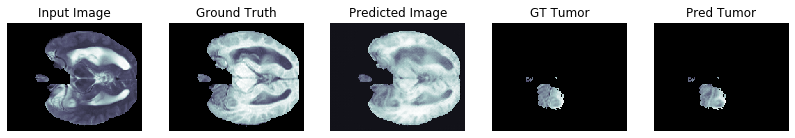

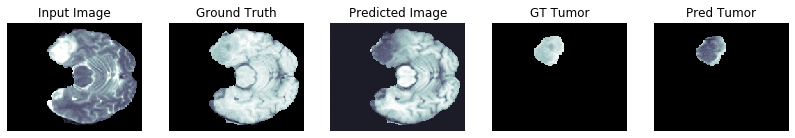

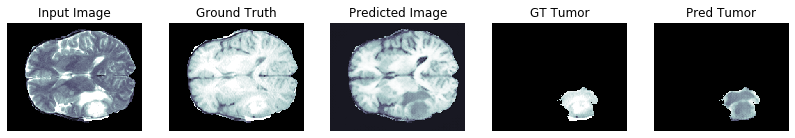

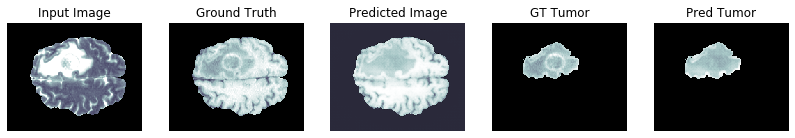

PSNR on validation set: 21.8828 ± 3.6149
MSE on validation set: 0.0082 ± 0.0048
SSIM on validation set: 0.8114 ± 0.0964

PSNR wrt tumor area on validation set: 33.4210 ± 11.0537
MSE wrt tumor area on validation set: 0.0014 ± 0.0016
SSIM wrt tumor area on validation set: 0.9677 ± 0.0303

Generator loss on validation set: 2.9668 ± 0.7997
Discriminator loss on validation set: 1.7316 ± 0.0204

Time taken for epoch 10 is 414.36281180381775 sec


Epoch:  11
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

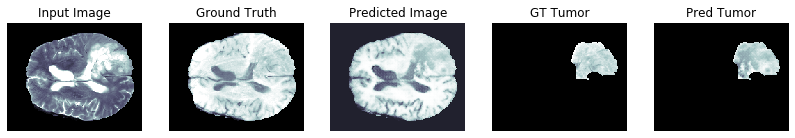

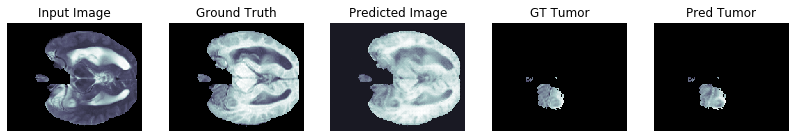

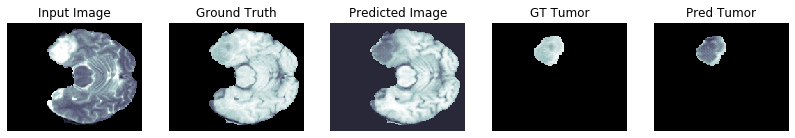

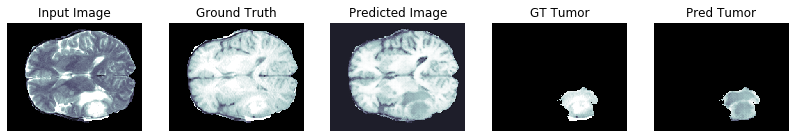

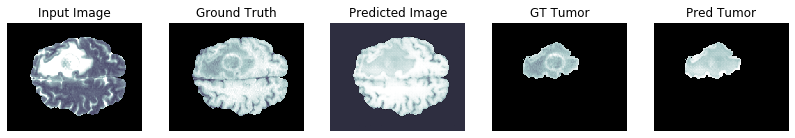

PSNR on validation set: 22.3334 ± 3.5856
MSE on validation set: 0.0074 ± 0.0042
SSIM on validation set: 0.8162 ± 0.0924

PSNR wrt tumor area on validation set: 34.2431 ± 10.1994
MSE wrt tumor area on validation set: 0.0011 ± 0.0012
SSIM wrt tumor area on validation set: 0.9710 ± 0.0273

Generator loss on validation set: 2.1486 ± 0.8700
Discriminator loss on validation set: 1.4872 ± 0.0168

Time taken for epoch 11 is 415.202579498291 sec


Epoch:  12
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

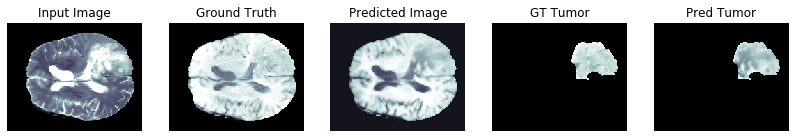

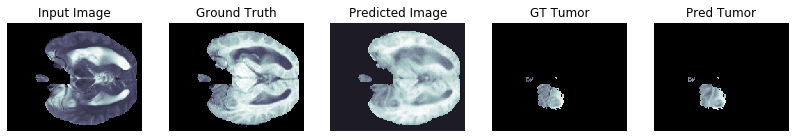

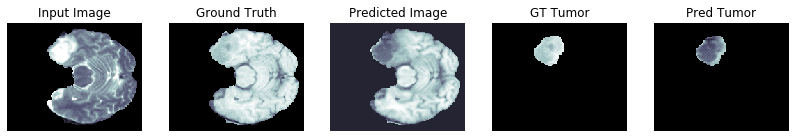

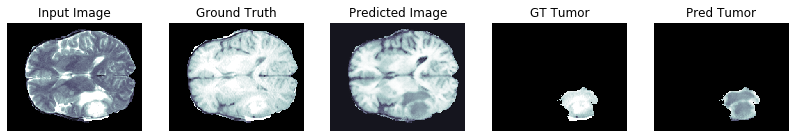

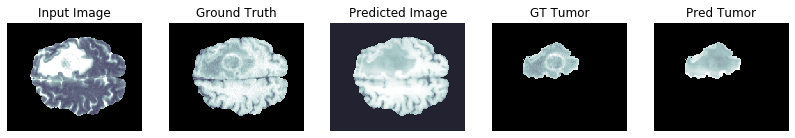

PSNR on validation set: 22.3238 ± 3.6398
MSE on validation set: 0.0074 ± 0.0044
SSIM on validation set: 0.8199 ± 0.0914

PSNR wrt tumor area on validation set: 33.5676 ± 11.2985
MSE wrt tumor area on validation set: 0.0013 ± 0.0015
SSIM wrt tumor area on validation set: 0.9688 ± 0.0289

Generator loss on validation set: 2.1370 ± 0.7902
Discriminator loss on validation set: 1.4642 ± 0.0115

Time taken for epoch 12 is 415.30573177337646 sec


Epoch:  13
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

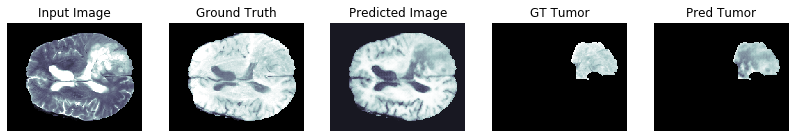

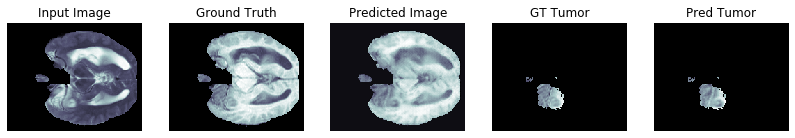

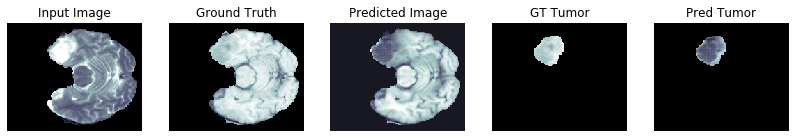

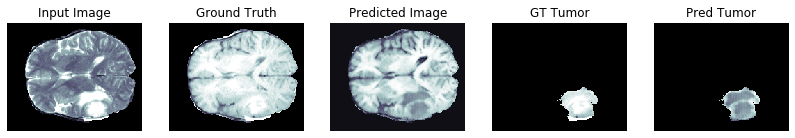

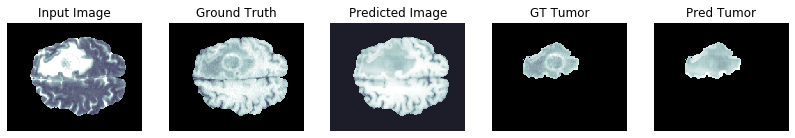

PSNR on validation set: 22.3928 ± 3.6160
MSE on validation set: 0.0073 ± 0.0042
SSIM on validation set: 0.8187 ± 0.0922

PSNR wrt tumor area on validation set: 33.6372 ± 11.4674
MSE wrt tumor area on validation set: 0.0013 ± 0.0015
SSIM wrt tumor area on validation set: 0.9687 ± 0.0289

Generator loss on validation set: 2.6945 ± 0.7299
Discriminator loss on validation set: 1.4938 ± 0.0185

Time taken for epoch 13 is 415.0174481868744 sec


Epoch:  14
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

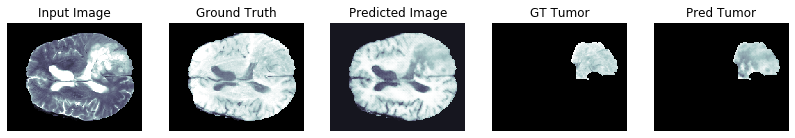

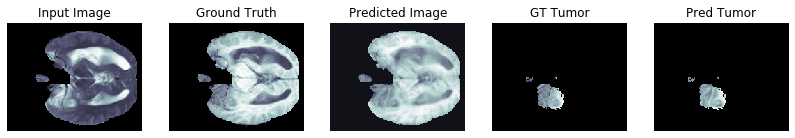

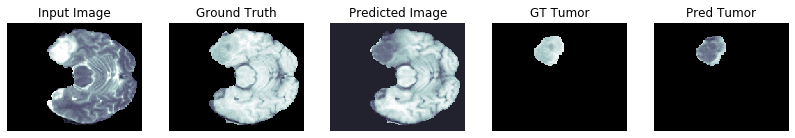

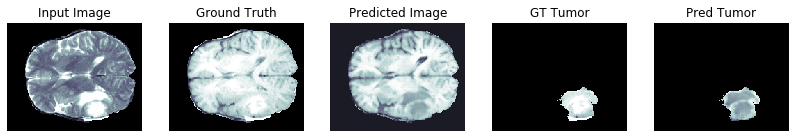

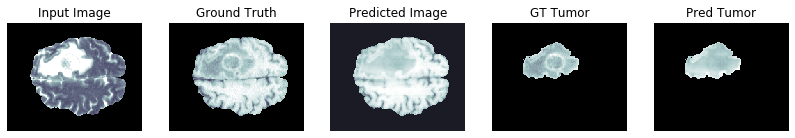

PSNR on validation set: 22.6482 ± 3.5806
MSE on validation set: 0.0069 ± 0.0041
SSIM on validation set: 0.8187 ± 0.0925

PSNR wrt tumor area on validation set: 34.1905 ± 10.1051
MSE wrt tumor area on validation set: 0.0011 ± 0.0012
SSIM wrt tumor area on validation set: 0.9716 ± 0.0270

Generator loss on validation set: 2.2200 ± 0.8493
Discriminator loss on validation set: 1.5144 ± 0.0135

Time taken for epoch 14 is 414.74996042251587 sec


Epoch:  15
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

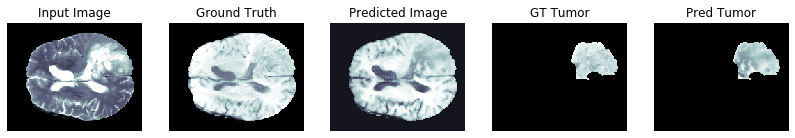

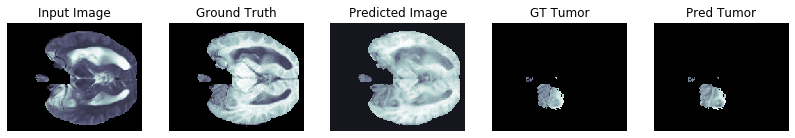

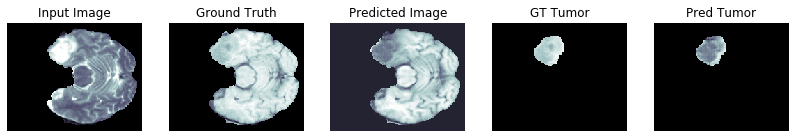

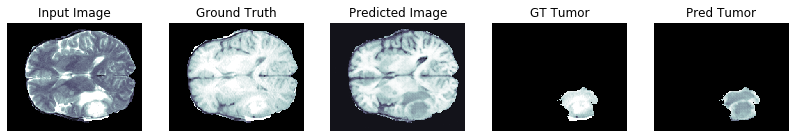

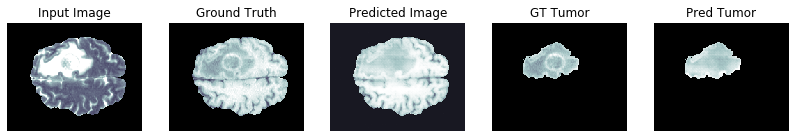

PSNR on validation set: 22.5577 ± 3.6475
MSE on validation set: 0.0070 ± 0.0041
SSIM on validation set: 0.8200 ± 0.0925

PSNR wrt tumor area on validation set: 34.0936 ± 11.1039
MSE wrt tumor area on validation set: 0.0011 ± 0.0012
SSIM wrt tumor area on validation set: 0.9707 ± 0.0270

Generator loss on validation set: 2.1072 ± 0.8077
Discriminator loss on validation set: 1.4717 ± 0.0153

Time taken for epoch 15 is 414.6061508655548 sec


Epoch:  16
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

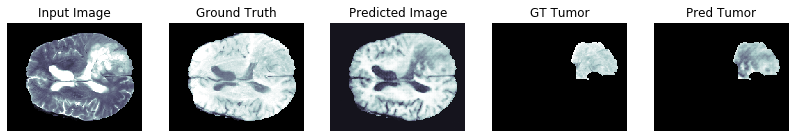

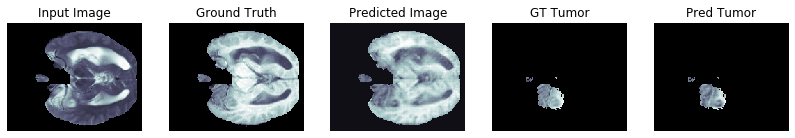

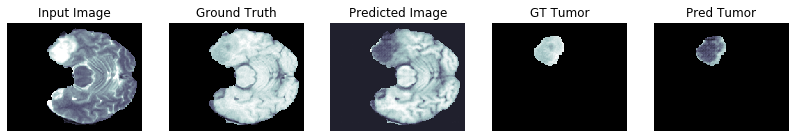

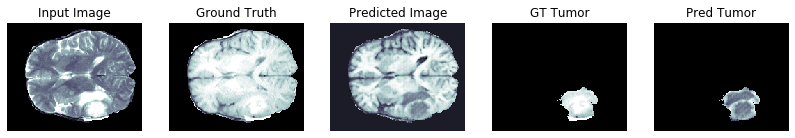

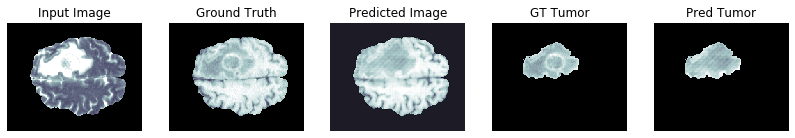

PSNR on validation set: 21.6098 ± 3.6741
MSE on validation set: 0.0087 ± 0.0050
SSIM on validation set: 0.8046 ± 0.0964

PSNR wrt tumor area on validation set: 32.3684 ± 10.5320
MSE wrt tumor area on validation set: 0.0016 ± 0.0019
SSIM wrt tumor area on validation set: 0.9628 ± 0.0327

Generator loss on validation set: 2.8231 ± 0.7473
Discriminator loss on validation set: 1.4877 ± 0.0207

Saving checkpoint for epoch 16 at ./drive/My Drive/checkpoints/train3/ckpt-2
Time taken for epoch 16 is 418.45815443992615 sec


Epoch:  17
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
................................................

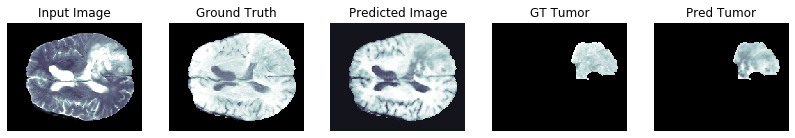

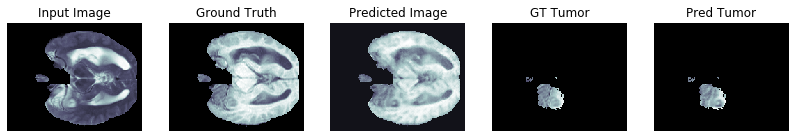

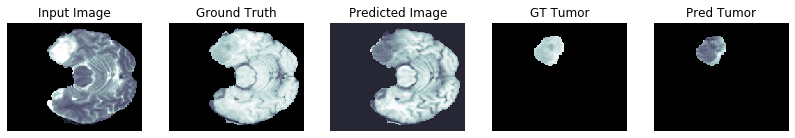

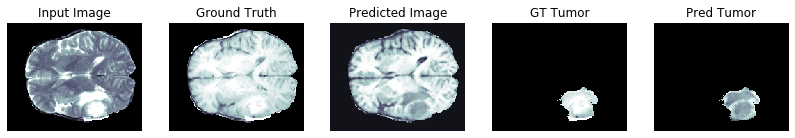

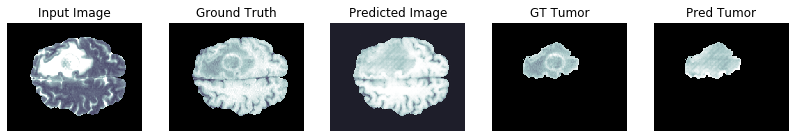

PSNR on validation set: 22.5745 ± 3.6082
MSE on validation set: 0.0070 ± 0.0041
SSIM on validation set: 0.8164 ± 0.0938

PSNR wrt tumor area on validation set: 33.6938 ± 11.1154
MSE wrt tumor area on validation set: 0.0012 ± 0.0014
SSIM wrt tumor area on validation set: 0.9687 ± 0.0283

Generator loss on validation set: 2.0150 ± 0.8723
Discriminator loss on validation set: 2.1565 ± 0.1221

Time taken for epoch 17 is 415.38106536865234 sec


Epoch:  18
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

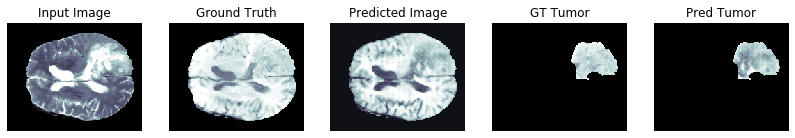

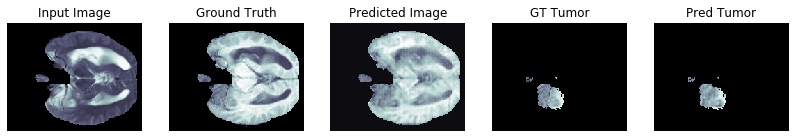

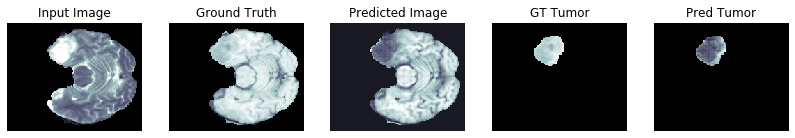

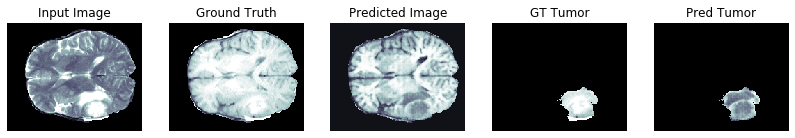

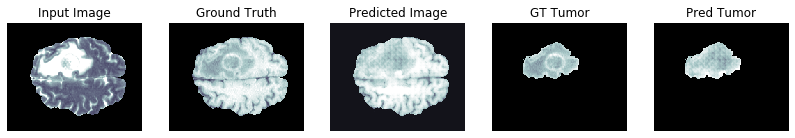

PSNR on validation set: 22.4607 ± 3.6224
MSE on validation set: 0.0072 ± 0.0042
SSIM on validation set: 0.8084 ± 0.0960

PSNR wrt tumor area on validation set: 33.0997 ± 10.1533
MSE wrt tumor area on validation set: 0.0014 ± 0.0016
SSIM wrt tumor area on validation set: 0.9659 ± 0.0302

Generator loss on validation set: 3.2152 ± 0.6916
Discriminator loss on validation set: 1.8005 ± 0.0793

Time taken for epoch 18 is 415.5841624736786 sec


Epoch:  19
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

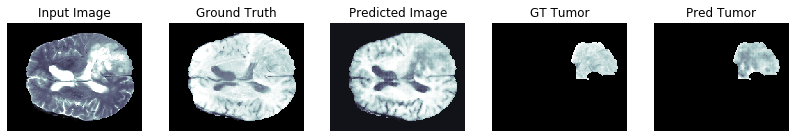

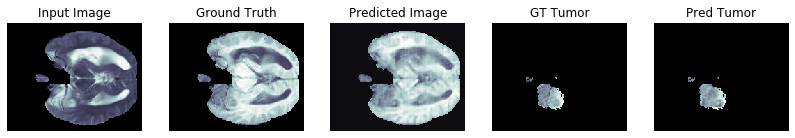

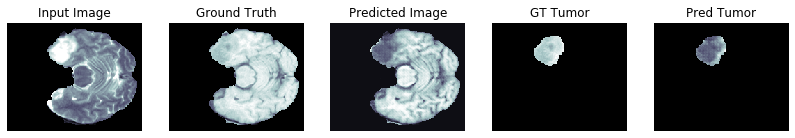

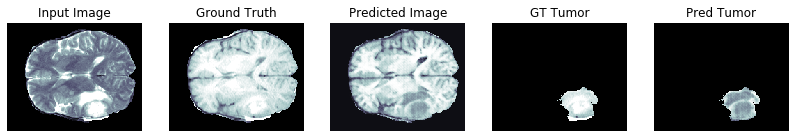

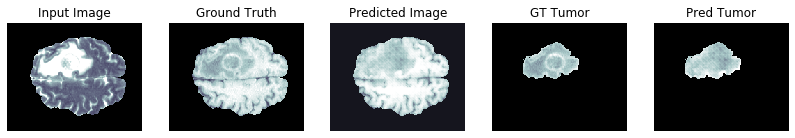

PSNR on validation set: 22.9374 ± 3.5750
MSE on validation set: 0.0064 ± 0.0039
SSIM on validation set: 0.8150 ± 0.0942

PSNR wrt tumor area on validation set: 33.3976 ± 9.2914
MSE wrt tumor area on validation set: 0.0012 ± 0.0014
SSIM wrt tumor area on validation set: 0.9677 ± 0.0287

Generator loss on validation set: 2.6419 ± 0.7962
Discriminator loss on validation set: 1.4576 ± 0.0061

Time taken for epoch 19 is 414.94077801704407 sec


Epoch:  20
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

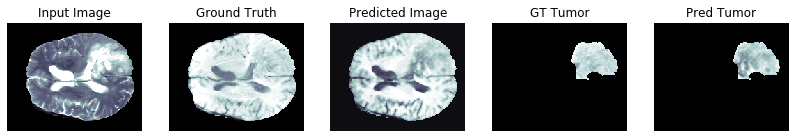

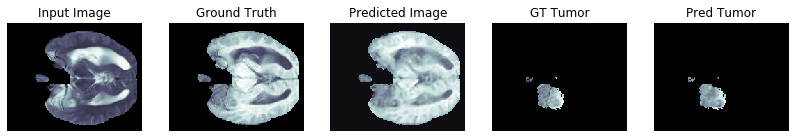

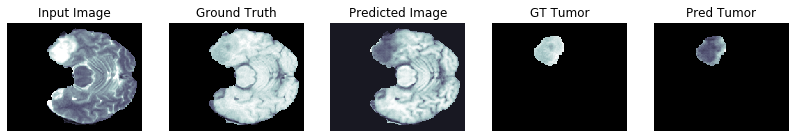

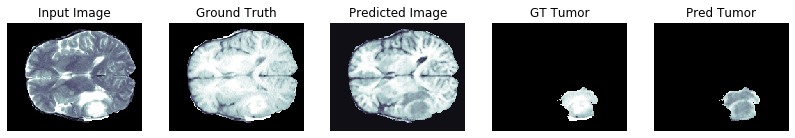

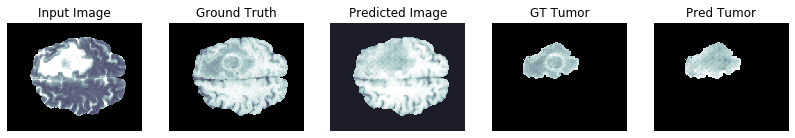

PSNR on validation set: 22.8290 ± 3.6175
MSE on validation set: 0.0066 ± 0.0039
SSIM on validation set: 0.8178 ± 0.0930

PSNR wrt tumor area on validation set: 33.6911 ± 10.0484
MSE wrt tumor area on validation set: 0.0012 ± 0.0013
SSIM wrt tumor area on validation set: 0.9686 ± 0.0283

Generator loss on validation set: 2.4107 ± 0.7906
Discriminator loss on validation set: 1.3903 ± 0.0073

Time taken for epoch 20 is 415.1585156917572 sec


Epoch:  21
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

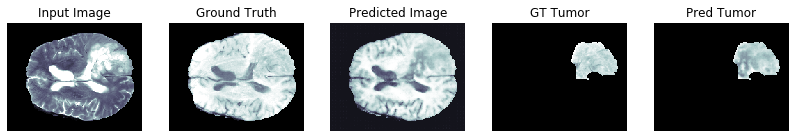

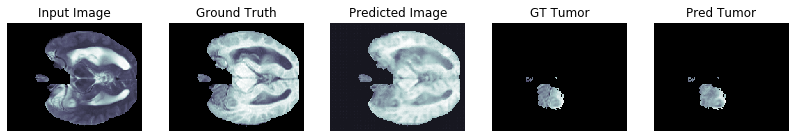

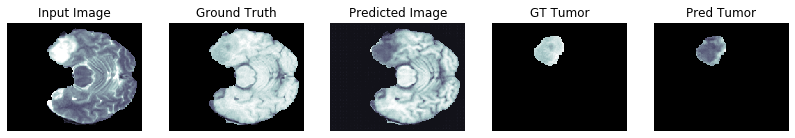

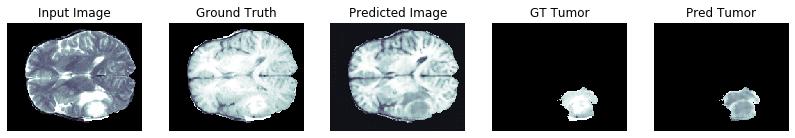

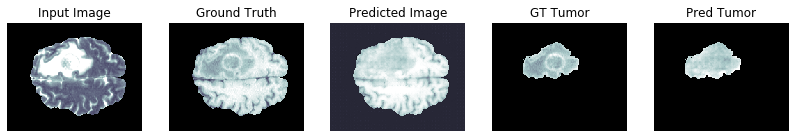

PSNR on validation set: 22.7593 ± 3.4127
MSE on validation set: 0.0066 ± 0.0039
SSIM on validation set: 0.8048 ± 0.0896

PSNR wrt tumor area on validation set: 34.1095 ± 10.0129
MSE wrt tumor area on validation set: 0.0011 ± 0.0013
SSIM wrt tumor area on validation set: 0.9704 ± 0.0275

Generator loss on validation set: 2.4076 ± 0.7524
Discriminator loss on validation set: 1.2291 ± 0.0545

Time taken for epoch 21 is 414.7285478115082 sec


Epoch:  22
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

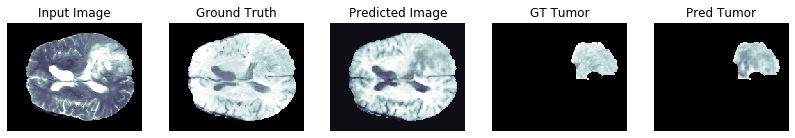

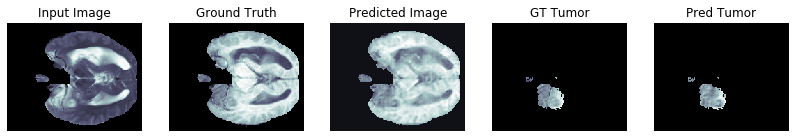

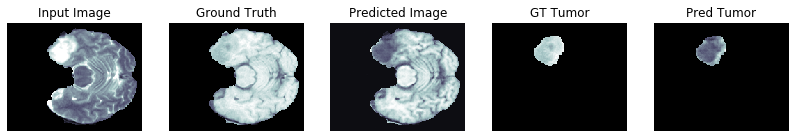

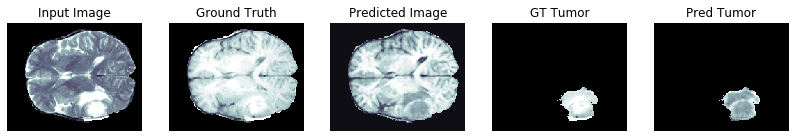

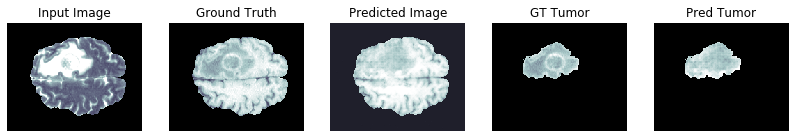

PSNR on validation set: 22.9126 ± 3.6139
MSE on validation set: 0.0065 ± 0.0039
SSIM on validation set: 0.8162 ± 0.0942

PSNR wrt tumor area on validation set: 33.9642 ± 11.4249
MSE wrt tumor area on validation set: 0.0011 ± 0.0014
SSIM wrt tumor area on validation set: 0.9690 ± 0.0281

Generator loss on validation set: 1.9919 ± 0.8471
Discriminator loss on validation set: 1.7805 ± 0.0667

Time taken for epoch 22 is 414.5581958293915 sec


Epoch:  23
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

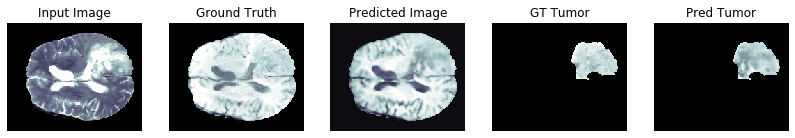

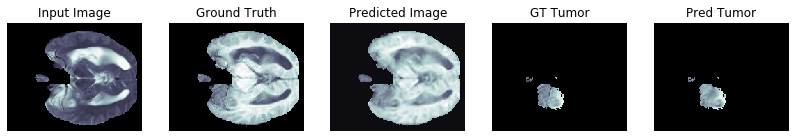

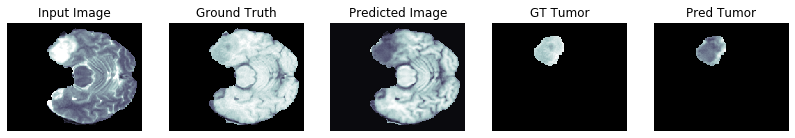

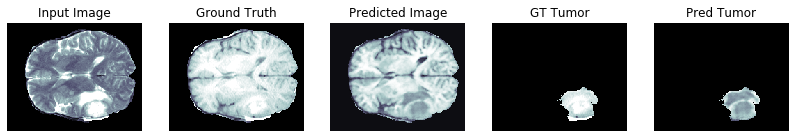

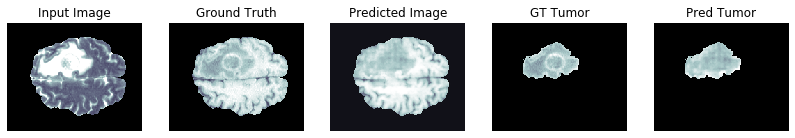

PSNR on validation set: 22.9848 ± 3.6645
MSE on validation set: 0.0064 ± 0.0039
SSIM on validation set: 0.8249 ± 0.0923

PSNR wrt tumor area on validation set: 33.7892 ± 10.2488
MSE wrt tumor area on validation set: 0.0012 ± 0.0014
SSIM wrt tumor area on validation set: 0.9697 ± 0.0278

Generator loss on validation set: 2.7511 ± 0.7337
Discriminator loss on validation set: 1.5142 ± 0.0210

Time taken for epoch 23 is 414.83200693130493 sec


Epoch:  24
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

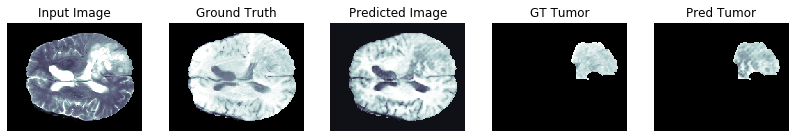

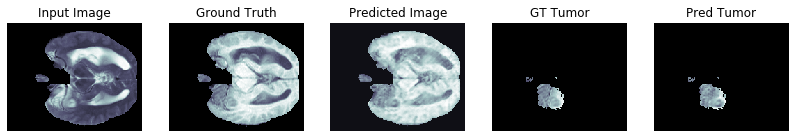

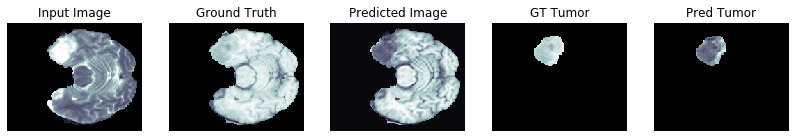

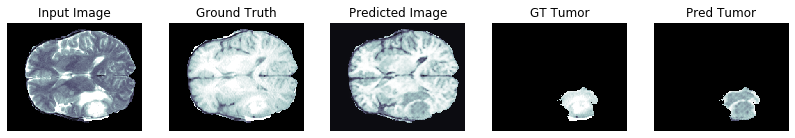

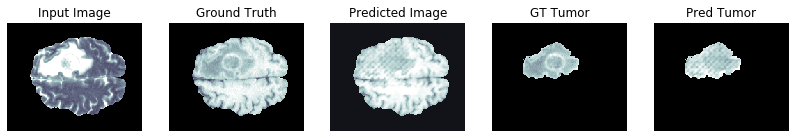

PSNR on validation set: 23.1575 ± 3.7307
MSE on validation set: 0.0062 ± 0.0039
SSIM on validation set: 0.8152 ± 0.0959

PSNR wrt tumor area on validation set: 33.8612 ± 9.9441
MSE wrt tumor area on validation set: 0.0011 ± 0.0013
SSIM wrt tumor area on validation set: 0.9679 ± 0.0290

Generator loss on validation set: 2.7582 ± 0.7555
Discriminator loss on validation set: 1.6248 ± 0.0384

Saving checkpoint for epoch 24 at ./drive/My Drive/checkpoints/train3/ckpt-3
Time taken for epoch 24 is 417.3813192844391 sec


Epoch:  25
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
..................................................

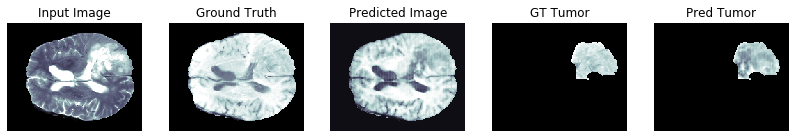

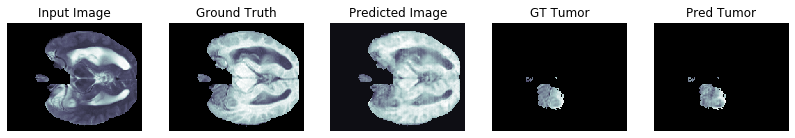

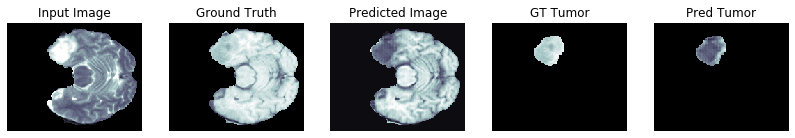

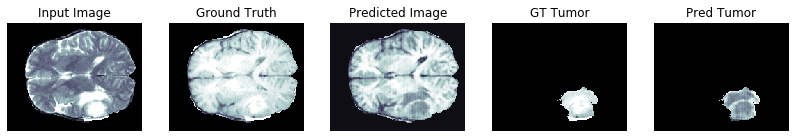

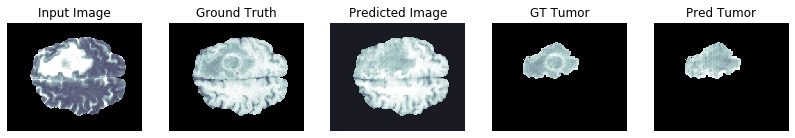

PSNR on validation set: 22.5975 ± 3.6019
MSE on validation set: 0.0069 ± 0.0040
SSIM on validation set: 0.8102 ± 0.0951

PSNR wrt tumor area on validation set: 33.2651 ± 11.9685
MSE wrt tumor area on validation set: 0.0014 ± 0.0017
SSIM wrt tumor area on validation set: 0.9656 ± 0.0307

Generator loss on validation set: 2.4339 ± 0.7323
Discriminator loss on validation set: 1.4361 ± 0.0069

Time taken for epoch 25 is 414.2736563682556 sec


Epoch:  26
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

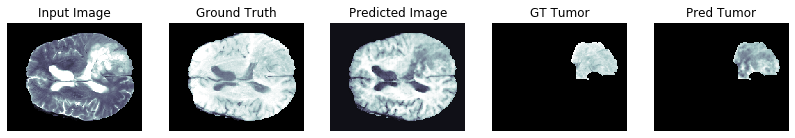

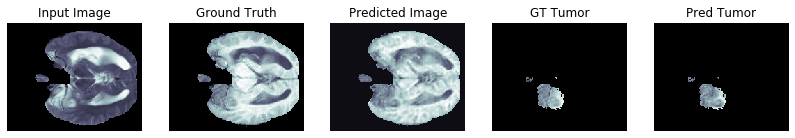

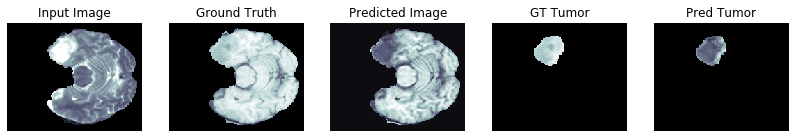

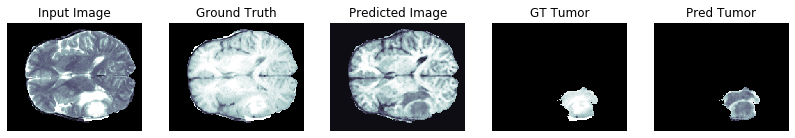

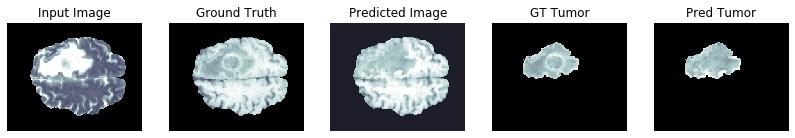

PSNR on validation set: 22.2498 ± 3.6280
MSE on validation set: 0.0075 ± 0.0043
SSIM on validation set: 0.8034 ± 0.0995

PSNR wrt tumor area on validation set: 32.6997 ± 11.0904
MSE wrt tumor area on validation set: 0.0015 ± 0.0018
SSIM wrt tumor area on validation set: 0.9635 ± 0.0323

Generator loss on validation set: 2.3972 ± 0.7951
Discriminator loss on validation set: 1.3903 ± 0.0041

Time taken for epoch 26 is 413.7790207862854 sec


Epoch:  27
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

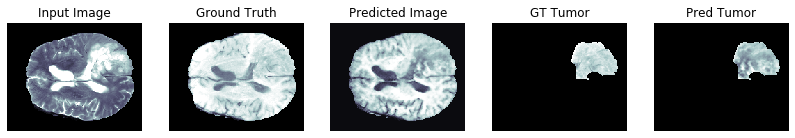

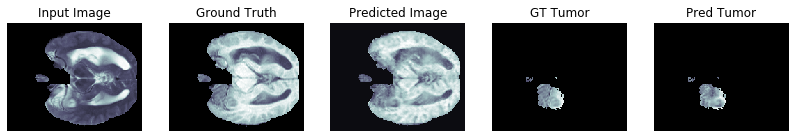

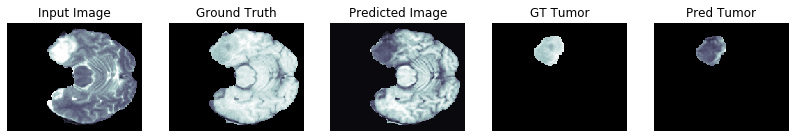

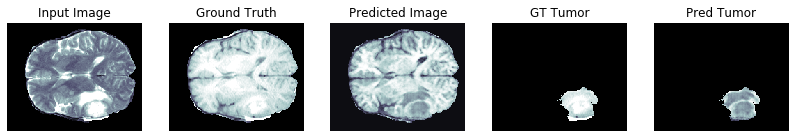

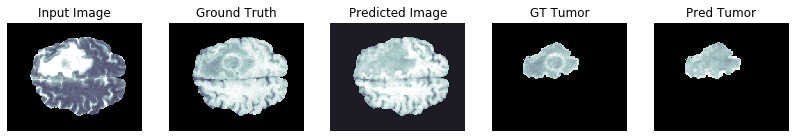

PSNR on validation set: 22.3876 ± 3.5825
MSE on validation set: 0.0072 ± 0.0041
SSIM on validation set: 0.8053 ± 0.0987

PSNR wrt tumor area on validation set: 32.7430 ± 9.3054
MSE wrt tumor area on validation set: 0.0014 ± 0.0017
SSIM wrt tumor area on validation set: 0.9647 ± 0.0316

Generator loss on validation set: 2.3661 ± 0.7502
Discriminator loss on validation set: 1.4148 ± 0.0143

Time taken for epoch 27 is 413.9336562156677 sec


Epoch:  28
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

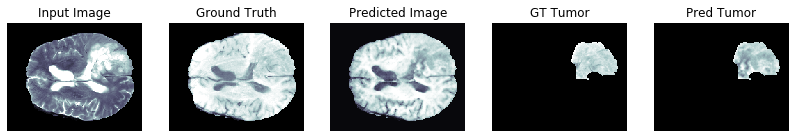

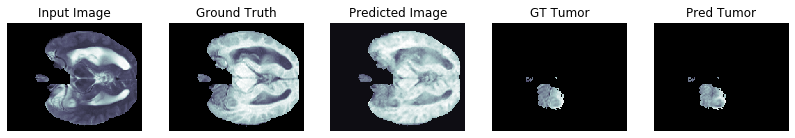

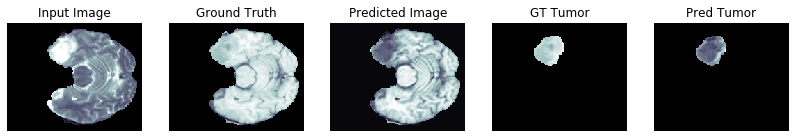

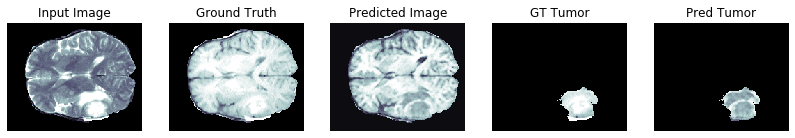

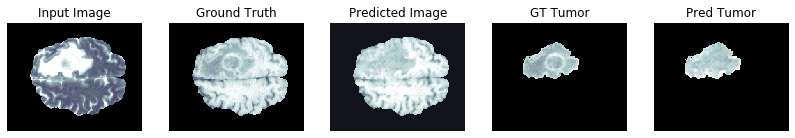

PSNR on validation set: 23.3043 ± 3.6898
MSE on validation set: 0.0060 ± 0.0038
SSIM on validation set: 0.8173 ± 0.0954

PSNR wrt tumor area on validation set: 33.9705 ± 10.1242
MSE wrt tumor area on validation set: 0.0011 ± 0.0012
SSIM wrt tumor area on validation set: 0.9691 ± 0.0283

Generator loss on validation set: 2.1916 ± 0.8455
Discriminator loss on validation set: 1.4342 ± 0.0106

Time taken for epoch 28 is 413.7709171772003 sec


Epoch:  29
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

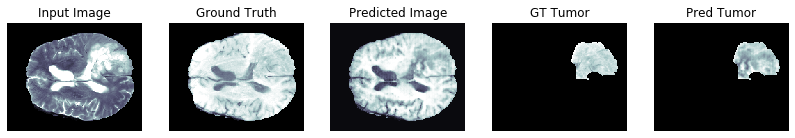

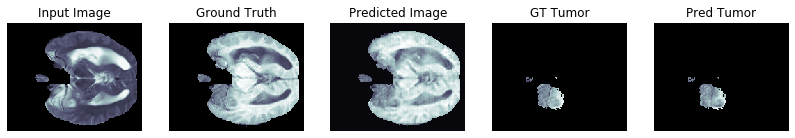

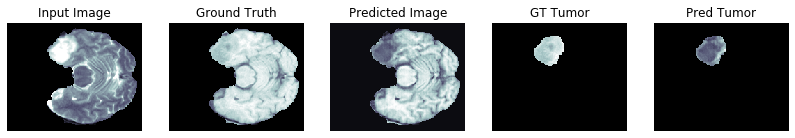

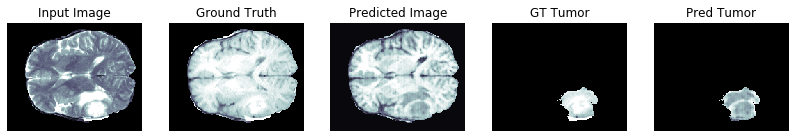

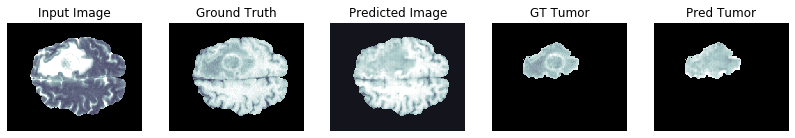

PSNR on validation set: 23.1426 ± 3.5917
MSE on validation set: 0.0061 ± 0.0038
SSIM on validation set: 0.8138 ± 0.0959

PSNR wrt tumor area on validation set: 33.6265 ± 10.2992
MSE wrt tumor area on validation set: 0.0012 ± 0.0013
SSIM wrt tumor area on validation set: 0.9682 ± 0.0288

Generator loss on validation set: 2.1685 ± 0.8051
Discriminator loss on validation set: 1.4251 ± 0.0063

Time taken for epoch 29 is 414.71941590309143 sec


Epoch:  30
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

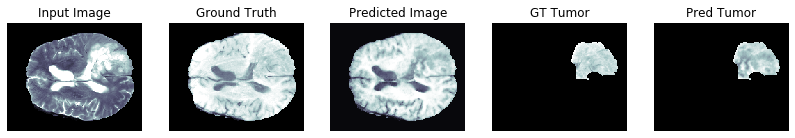

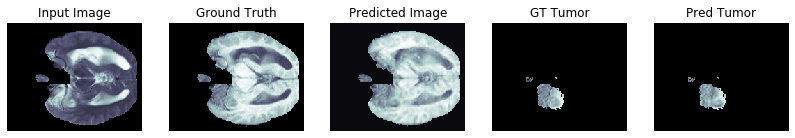

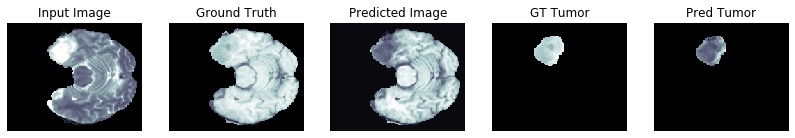

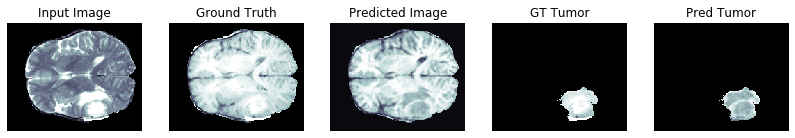

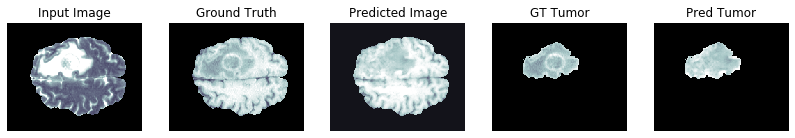

PSNR on validation set: 23.4320 ± 3.6669
MSE on validation set: 0.0058 ± 0.0037
SSIM on validation set: 0.8196 ± 0.0943

PSNR wrt tumor area on validation set: 34.1161 ± 9.9080
MSE wrt tumor area on validation set: 0.0011 ± 0.0012
SSIM wrt tumor area on validation set: 0.9701 ± 0.0277

Generator loss on validation set: 2.3373 ± 0.8159
Discriminator loss on validation set: 1.3903 ± 0.0047

Time taken for epoch 30 is 414.2157053947449 sec


Epoch:  31
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

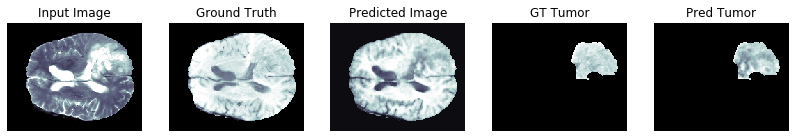

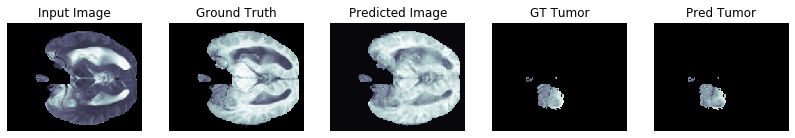

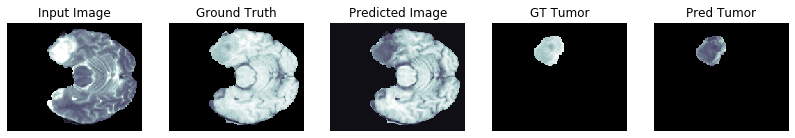

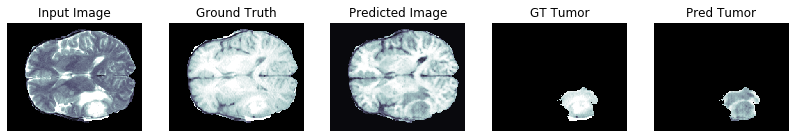

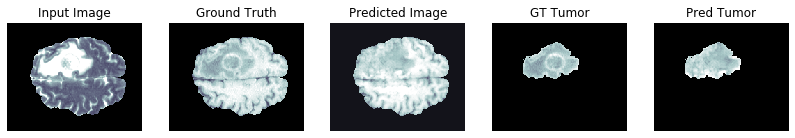

PSNR on validation set: 23.1376 ± 3.5706
MSE on validation set: 0.0061 ± 0.0038
SSIM on validation set: 0.8137 ± 0.0956

PSNR wrt tumor area on validation set: 33.7507 ± 10.0125
MSE wrt tumor area on validation set: 0.0012 ± 0.0013
SSIM wrt tumor area on validation set: 0.9682 ± 0.0291

Generator loss on validation set: 2.2101 ± 0.8056
Discriminator loss on validation set: 1.4030 ± 0.0036

Time taken for epoch 31 is 414.8713221549988 sec


Epoch:  32
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

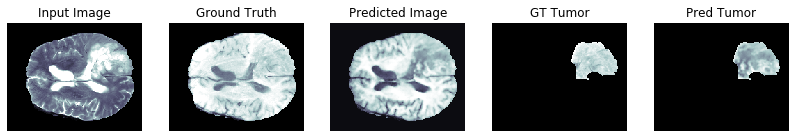

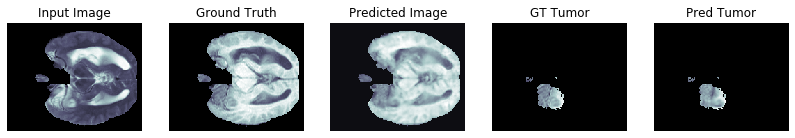

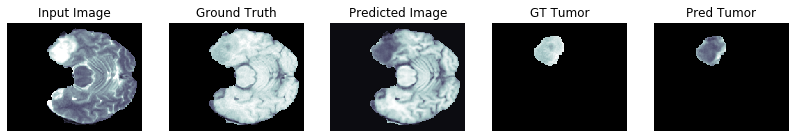

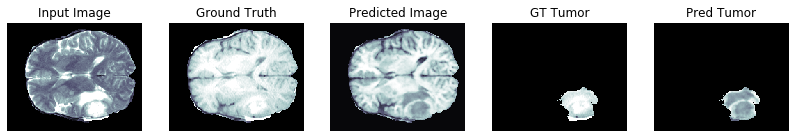

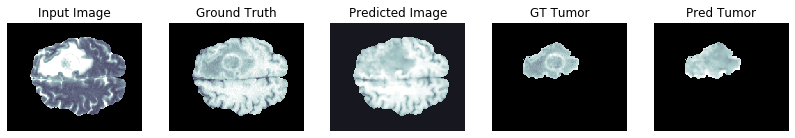

PSNR on validation set: 23.3746 ± 3.7493
MSE on validation set: 0.0059 ± 0.0038
SSIM on validation set: 0.8281 ± 0.0923

PSNR wrt tumor area on validation set: 33.8584 ± 10.0993
MSE wrt tumor area on validation set: 0.0012 ± 0.0013
SSIM wrt tumor area on validation set: 0.9697 ± 0.0282

Generator loss on validation set: 2.6246 ± 0.7635
Discriminator loss on validation set: 1.4713 ± 0.0139

Saving checkpoint for epoch 32 at ./drive/My Drive/checkpoints/train3/ckpt-4
Time taken for epoch 32 is 418.289489030838 sec


Epoch:  33
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
..................................................

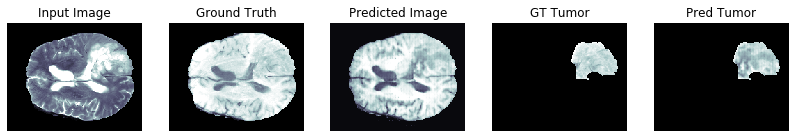

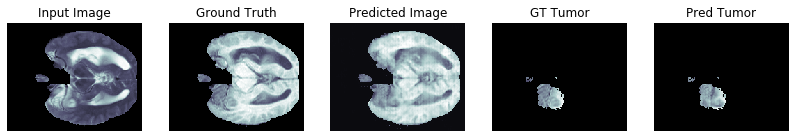

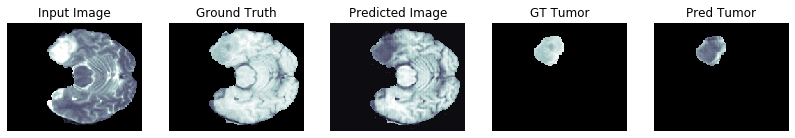

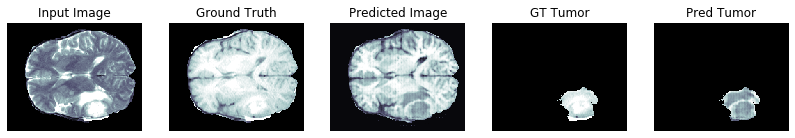

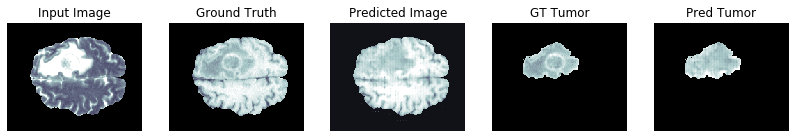

PSNR on validation set: 23.2311 ± 3.6850
MSE on validation set: 0.0061 ± 0.0038
SSIM on validation set: 0.8077 ± 0.0980

PSNR wrt tumor area on validation set: 33.8532 ± 11.4122
MSE wrt tumor area on validation set: 0.0012 ± 0.0013
SSIM wrt tumor area on validation set: 0.9681 ± 0.0289

Generator loss on validation set: 2.2561 ± 0.7832
Discriminator loss on validation set: 1.4118 ± 0.0152

Time taken for epoch 33 is 415.8291907310486 sec


Epoch:  34
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

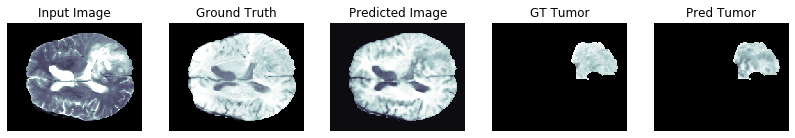

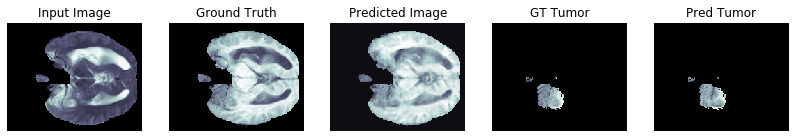

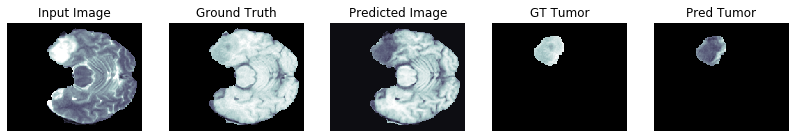

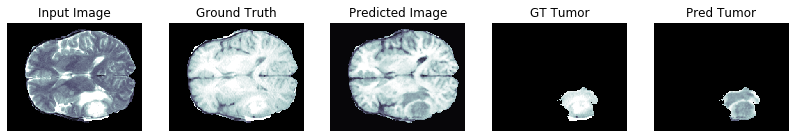

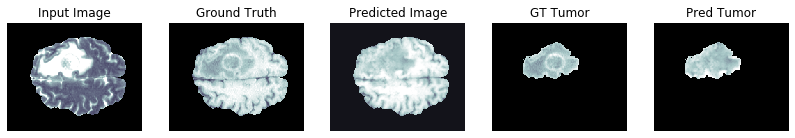

PSNR on validation set: 23.4044 ± 3.6442
MSE on validation set: 0.0059 ± 0.0038
SSIM on validation set: 0.8207 ± 0.0938

PSNR wrt tumor area on validation set: 33.9728 ± 10.7973
MSE wrt tumor area on validation set: 0.0011 ± 0.0013
SSIM wrt tumor area on validation set: 0.9690 ± 0.0286

Generator loss on validation set: 2.6437 ± 0.7515
Discriminator loss on validation set: 1.5522 ± 0.0252

Time taken for epoch 34 is 416.05295276641846 sec


Epoch:  35
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

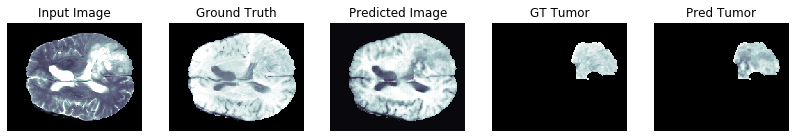

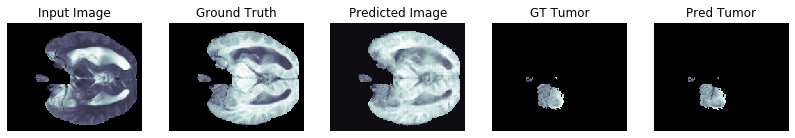

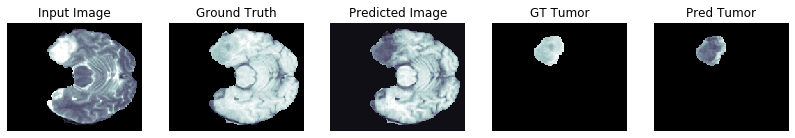

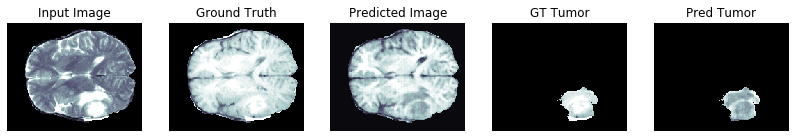

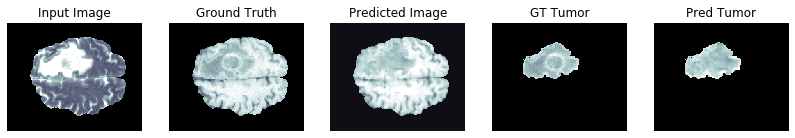

PSNR on validation set: 23.2392 ± 3.6571
MSE on validation set: 0.0061 ± 0.0041
SSIM on validation set: 0.8131 ± 0.0966

PSNR wrt tumor area on validation set: 33.7671 ± 10.4524
MSE wrt tumor area on validation set: 0.0012 ± 0.0014
SSIM wrt tumor area on validation set: 0.9681 ± 0.0295

Generator loss on validation set: 1.9930 ± 0.8252
Discriminator loss on validation set: 1.7074 ± 0.0573

Time taken for epoch 35 is 416.2371578216553 sec

Saving FINAL checkpoint for epoch 35 at ./drive/My Drive/checkpoints/train3/ckpt-5


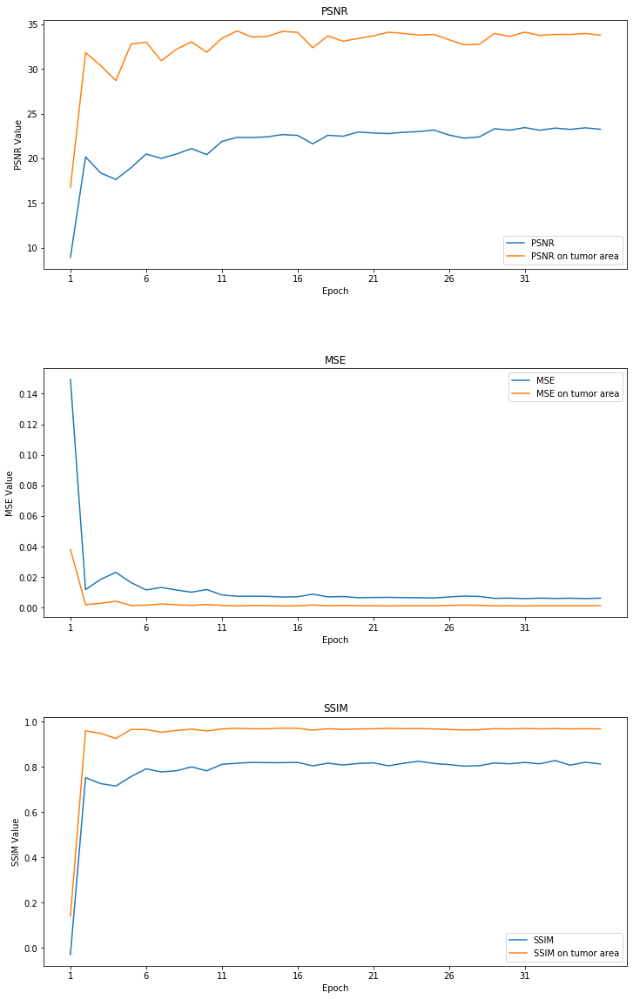

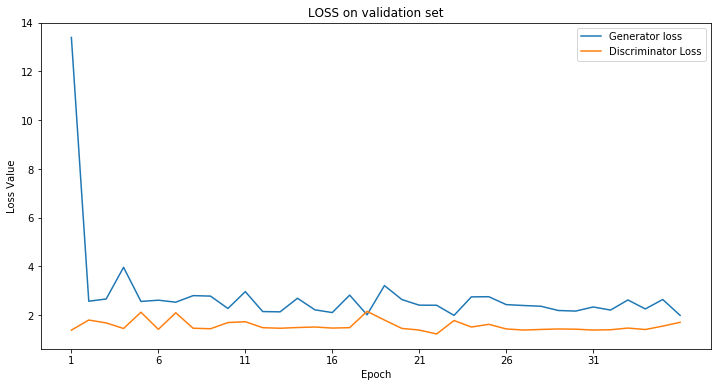

In [41]:
EPOCHS = 35
save_checkpoint = True         # want to save new checkpoints ? 
save_final_models = True       # want to save the model at the end of the training ? 
epochs_already_trained = 0      # this is just for the print. 
evaluate_tumor_quality = True   # compute & print metrics on tumor area ?
print_loss = True               # compute & print the validation loss ?


# Initialize the models, so that I don't have to restart the runtime again.

if tf.equal(evaluate_tumor_quality, True) and tf.equal(print_loss, False):
    psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = fit(training, EPOCHS, validation, save_checkpoint, 
                                                    epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor)

elif tf.equal(evaluate_tumor_quality, False) and tf.equal(print_loss, True):
    psnr, mse, ssim, gen_loss, dis_loss = fit(training, EPOCHS, validation, save_checkpoint, 
                                                    epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim)
    plot_loss(gen_loss, dis_loss)

elif tf.equal(evaluate_tumor_quality, True) and tf.equal(print_loss, True):
    psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, gen_loss, dis_loss = fit(training, EPOCHS, validation, save_checkpoint, 
                                                        epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor)
    plot_loss(gen_loss, dis_loss)
else:
    psnr, mse, ssim = fit(training, EPOCHS, validation, save_checkpoint, 
                                                      epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim)

# at the end, I'll save the models (I would need only the gen, but let's sayve also the disc  )
# (it saves the entire model to a HDF5 file)

if save_final_models:
    generator.save('drive/My Drive/MRI-generation/gen_T1_35ep.h5')

##Evaluating the final model with the test set

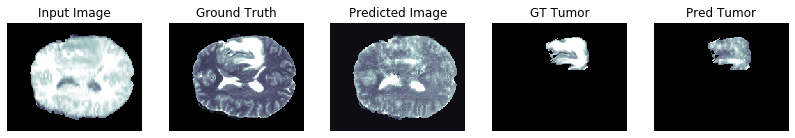

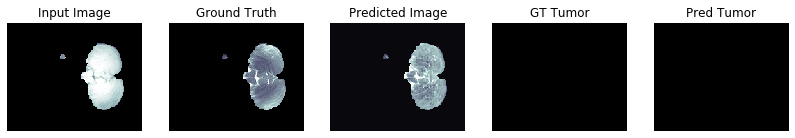

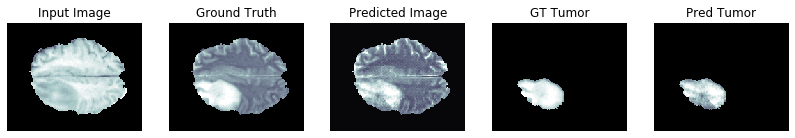

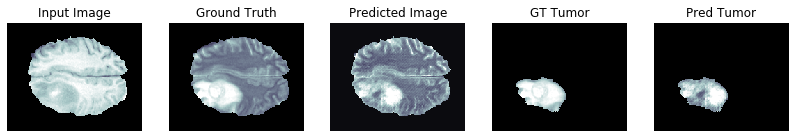

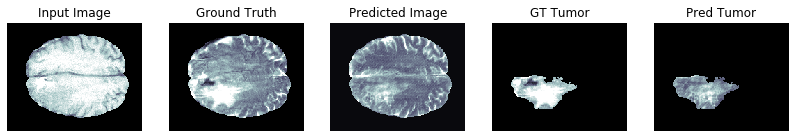

PSNR on test set: 21.5639 ± 3.9366
MSE on test set: 0.0096 ± 0.0073
SSIM on test set: 0.7459 ± 0.1301

PSNR wrt tumor area on test set: 30.1492 ± 11.8962
MSE wrt tumor area on test set: 0.0028 ± 0.0031
SSIM wrt tumor area on test set: 0.9464 ± 0.0480

Generator loss on test set: 2.8542 ± 0.5737
Discriminator loss on test set: 1.4620 ± 0.0166


(<tf.Tensor: shape=(), dtype=float32, numpy=21.563932>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.009605348>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.7458917>,
 <tf.Tensor: shape=(), dtype=float32, numpy=30.149174>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.002755372>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.94644946>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.8541603>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.4620405>)

In [0]:
# Let's check the scores of this model.

evaluate_GAN(generator, testing, 'test', True, True)

In [0]:
PSNR on test set: 21.5639 ± 3.9366
MSE on test set: 0.0096 ± 0.0073
SSIM on test set: 0.7459 ± 0.1301

PSNR wrt tumor area on test set: 30.2452 ± 12.6697
MSE wrt tumor area on test set: 0.0028 ± 0.0031
SSIM wrt tumor area on test set: 0.9464 ± 0.0480

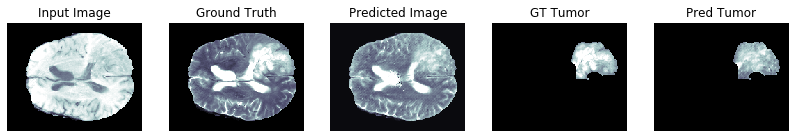

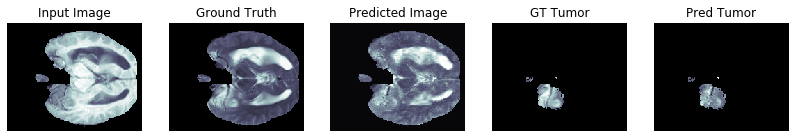

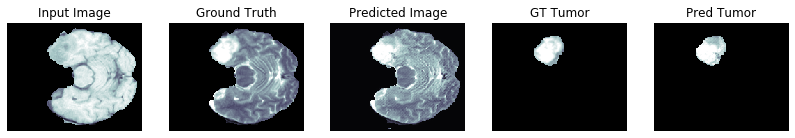

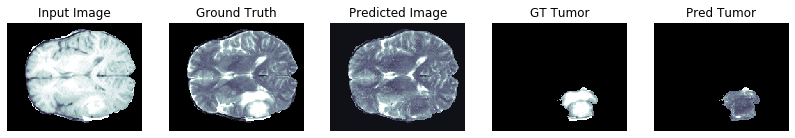

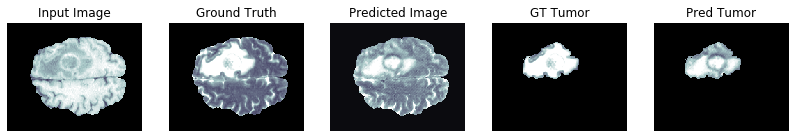

PSNR on validation set: 21.9011 ± 3.8247
MSE on validation set: 0.0085 ± 0.0060
SSIM on validation set: 0.7719 ± 0.1147

PSNR wrt tumor area on validation set: 31.1287 ± 12.5418
MSE wrt tumor area on validation set: 0.0028 ± 0.0035
SSIM wrt tumor area on validation set: 0.9504 ± 0.0487

Generator loss on validation set: 2.5975 ± 1.0035
Discriminator loss on validation set: 1.4567 ± 0.0333


(<tf.Tensor: shape=(), dtype=float32, numpy=21.901085>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.008548103>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.7719031>,
 <tf.Tensor: shape=(), dtype=float32, numpy=31.12871>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.0027539323>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.95037156>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.5975351>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.4566851>)

In [0]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

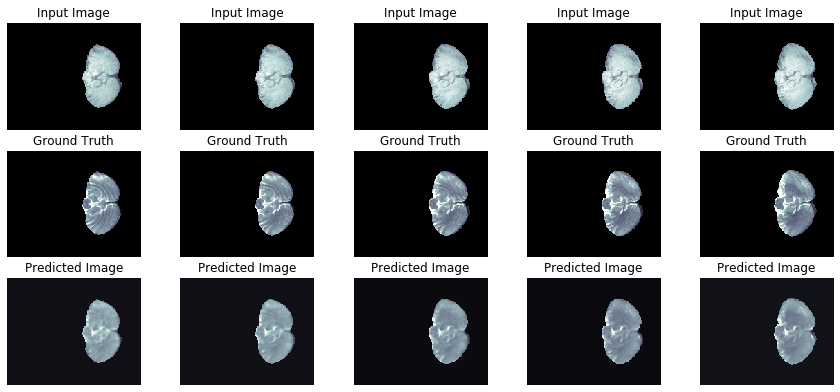


PSNR on validation set: 22.1073 ± 4.0440
MSE on validation set: 0.0085 ± 0.0066
SSIM on validation set: 0.8012 ± 0.1050

PSNR wrt tumor area on validation set: 31.5274 ± 12.9959
MSE wrt tumor area on validation set: 0.0028 ± 0.0040
SSIM wrt tumor area on validation set: 0.9522 ± 0.0510

Generator loss on validation set: 2.6157 ± 1.0658
Discriminator loss on validation set: 1.3909 ± 0.0141


(<tf.Tensor: shape=(), dtype=float32, numpy=22.107252>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.008504067>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.80120814>,
 <tf.Tensor: shape=(), dtype=float32, numpy=31.527384>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.002845238>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.95223486>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.6156569>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.3908572>)

In [0]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

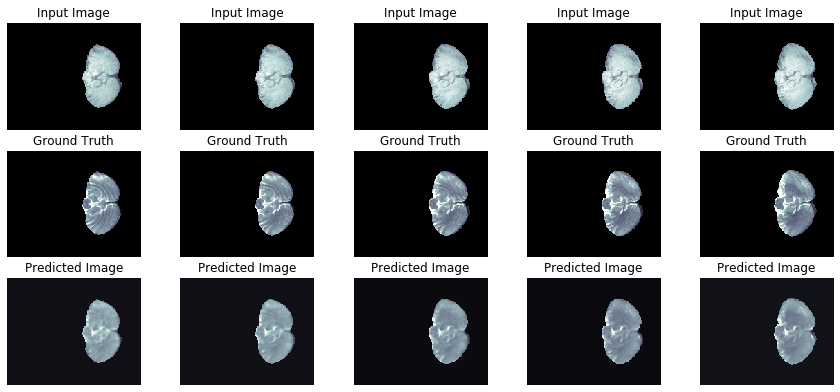


PSNR on validation set: 22.1073 ± 4.0440
MSE on validation set: 0.0085 ± 0.0066
SSIM on validation set: 0.8012 ± 0.1050

PSNR wrt tumor area on validation set: 31.5274 ± 12.9959
MSE wrt tumor area on validation set: 0.0028 ± 0.0040
SSIM wrt tumor area on validation set: 0.9522 ± 0.0510

Generator loss on validation set: 2.6157 ± 1.0658
Discriminator loss on validation set: 1.3909 ± 0.0141


(<tf.Tensor: shape=(), dtype=float32, numpy=22.107252>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.008504067>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.80120826>,
 <tf.Tensor: shape=(), dtype=float32, numpy=31.527384>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.002845238>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.95223486>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.6156569>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.3908572>)

In [0]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

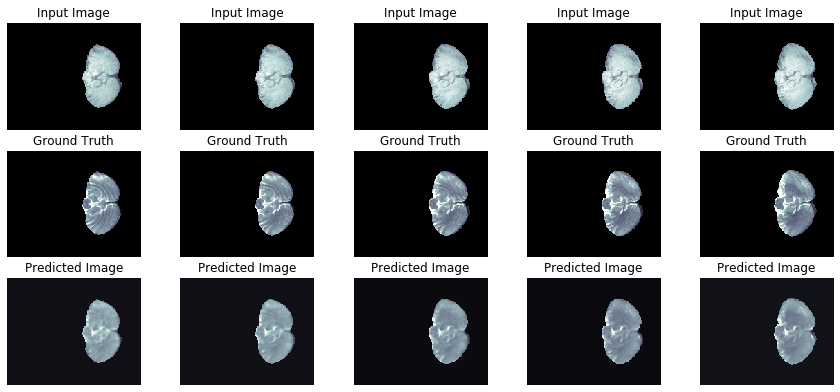


PSNR on validation set: 22.1073 ± 4.0440
MSE on validation set: 0.0085 ± 0.0066
SSIM on validation set: 0.8012 ± 0.1050

PSNR wrt tumor area on validation set: 31.5274 ± 12.9959
MSE wrt tumor area on validation set: 0.0028 ± 0.0040
SSIM wrt tumor area on validation set: 0.9522 ± 0.0510

Generator loss on validation set: 2.6445 ± 1.0748
Discriminator loss on validation set: 1.4045 ± 0.0117


(<tf.Tensor: shape=(), dtype=float32, numpy=22.107252>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.008504067>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.80120814>,
 <tf.Tensor: shape=(), dtype=float32, numpy=31.527384>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.002845238>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.95223486>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.6445024>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.4045321>)

In [0]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

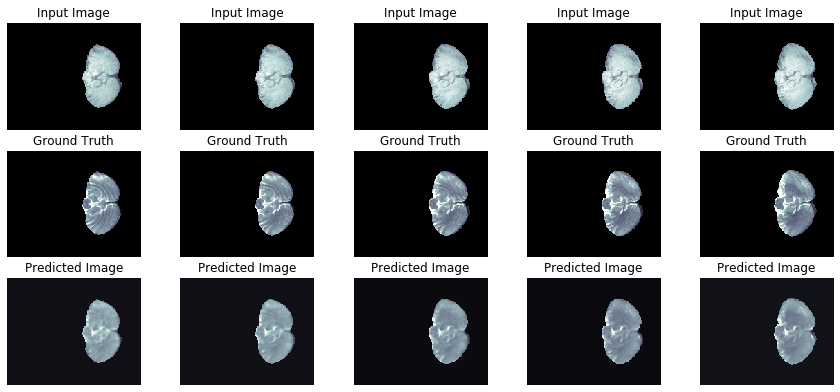


PSNR on validation set: 22.1073 ± 4.0440
MSE on validation set: 0.0085 ± 0.0066
SSIM on validation set: 0.8012 ± 0.1050

PSNR wrt tumor area on validation set: 31.4163 ± 12.1272
MSE wrt tumor area on validation set: 0.0028 ± 0.0040
SSIM wrt tumor area on validation set: 0.9522 ± 0.0510

Generator loss on validation set: 2.6445 ± 1.0748
Discriminator loss on validation set: 1.4045 ± 0.0117


(<tf.Tensor: shape=(), dtype=float32, numpy=22.107252>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.008504067>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.80120814>,
 <tf.Tensor: shape=(), dtype=float32, numpy=31.416317>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.002845238>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.95223486>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.6445024>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.4045321>)

In [0]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

## Considerations about metrics and normalization

In [0]:
training, validation, testing = load_datasets() # I'll use this in case I get stuck with the cache.

In [0]:
for raw_record in testing.take(1):
    inp, ground_truth = take_images_from_raw(raw_record)

    prediction = generator(inp, training=False)
    inp, ground_truth, prediction = resize_with_crop(inp, ground_truth, prediction)

    prediction_normalized = mean_normalize(prediction)
    ground_truth_normalized = mean_normalize(ground_truth) 

    #prediction_normalized2 = min_max_normalize(prediction)
    
    # remove black images from ground_truth is not that necessary because it's enough to do it on the predictions. 
    # Anyway, just to be sure, let's remove them also from the ground truth (so the metrics of those images will be ignored)

    # BLACK IMAGES ARE DISCARDED IN ALL THE METRICS COMPUTED. Both in the case where I normalize and in the one in which I don't.
    # What if, in the case in which I don't normalize, I keep the black images? We would have significant differences.
    # For example PSNR would be 27.0207 ± 10.2544 instead of  25.2498 ± 2.8603 (with the model trained)
    ground_truth = black_images_to_nan(ground_truth)
    prediction = black_images_to_nan(prediction)

    #mean, std, psnr = compute_psnr(ground_truth, prediction_normalized2)
    #print("PSNR w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, psnr = compute_psnr(ground_truth_normalized, prediction_normalized)
    print("PSNR w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, psnr = compute_psnr(ground_truth, prediction)
    print("PSNR: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    print()
    #mean, std, ssim = compute_ssim(ground_truth, prediction_normalized2)
    #print("SSIM w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, ssim = compute_ssim(ground_truth_normalized, prediction_normalized)
    print("SSIM w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, ssim = compute_ssim(ground_truth, prediction)
    print("SSIM: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    print()
    #mean, std, mse = compute_mse(ground_truth, prediction_normalized2)
    #print("SSIM w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, mse = compute_mse(ground_truth_normalized, prediction_normalized)
    print("MSE w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, mse = compute_mse(ground_truth, prediction)
    print("MSE: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))

## Additional notes

In [0]:
# in the testing there are 28 patients so 128*28 = 3584 samples
# with a batch_size of 32, we have 112 elements in the prefetched TEST set so 3584 samples.
# in the VALIDATION SET: 108 elements * 32 (batch_size) = 3456 samples.
# in the TRAINING set: 876 elements * 32 = 28032

# each samples has then all the scans defined in the load_dataset (up to 4 scans + the segmented area)
# if batch size is set to 32, then there are less then 100 samples.

# training: with GPU it crashes, with TPU works. a bit more of 28000 samples -> 219 patients * 128 levels.

# training with 100 samples, batch size = 1 and TPU took 46 seconds
# training with 100 samples, batch size = 1 and GPU took 7/8 seconds

# training with 1000 samples, batch size = 1, resizing to 256, GPU took 54 seconds
# training with 1000 samples, batch size = 1, padding to 256, GPU took 52 seconds

# TRAINING TIMES WITH DIFFERENT BATCH SIZES:
# training with 16 samples and batch size = 64 (so 1024 samples fed to the GAN), TPU took 209 seconds

# training with 1000 samples and batch size = 1 (so 1000 samples fed to the GAN), GPU took about 490 seconds (8 min)
# training with 250 samples and bs = 4 (so 1000 samples fed to the GAN), GPU took 127 seconds!
# training with 128 samples and bs = 8 (so 1024 samples fed to the GAN), GPU took 75 seconds!
# training with 64 samples and bs = 16 (so 1024 samples fed to the GAN), GPU took 41 seconds!
# training with 31 samples and bs = 32 (so still 992 samples fed to the GAN), GPU took 28/32/33
# training with 16 samples and bs = 64 (so 1024 samples fed to the GAN), GPU took 23/25/26 seconds!

# training with 8 samples and bs = 128, GPU took 24/25( 21 in the most recent) sec! -> not so good quality
# (It has been observed in practice that when using a larger batch there is a significant degradation in the 
# quality of the model, as measured by its ability to generalize.)
# https://stats.stackexchange.com/questions/164876/tradeoff-batch-size-vs-number-of-iterations-to-train-a-neural-network

# The resulting model may not generalize as well as a model trained with a small batch size

# tradeoff between 32 and 64. 32 seems to be qualitatively more accurate but it's a bit slower. 
# before choosing, it would be better to implement also the quantitative metrics.

# from pix2pix paper: use batch sizes between 1 and 10 depending on the experiment


# In general, batch size of 32 is a good starting point, and you should also try with 64, 128, and 256. 
# Other values (lower or higher) may be fine for some data sets, but the given range is generally the best to 
# start experimenting with. Though, under 32, it might get too slow because of significantly lower computational speed, 
# because of not exploiting vectorization to the full extent.  
# If you get an "out of memory" error, you should try reducing the mini-batch size anyway.


# training with 4 samples and bs = 256, GPU run out of memory. Resource exhausted.

In [0]:
# np.FUNCTION VS tf.FUNCTION

# np =  training with 31 samples and bs = 32 (992 samples fed to the GAN), GPU took 28/32/33
# training with 32 samples and bs = 32 (1024 samples fed to the GAN), GPU took 14/15/16/17 seconds 